In [1]:
# %matplotlib inline
%config InlineBackend.figure_format = "retina"

In [5]:
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.simplefilter(action="ignore", category=FutureWarning)
sns.set_theme(context="talk", style="whitegrid",
              palette="colorblind", color_codes=True,
              rc={"figure.figsize": [12, 8]})

# Credit Default with Advanced Machine Learning Techique

## References:
- Getting Deeper into Categorical Encodings for Machine Learning. https://medium.com/towards-data-science/getting-deeper-into-categorical-encodings-for-machine-learning-2312acd347c8
- imblearn. https://imbalanced-learn.org/stable/user_guide.html
- Python-sklearn中的Pipeline. https://blog.csdn.net/Hanx09/article/details/107722833?spm=1001.2101.3001.6650.2&utm_medium=distribute.pc_relevant.none-task-blog-2%7Edefault%7ECTRLIST%7ERate-2-107722833-blog-106453314.235%5Ev32%5Epc_relevant_increate_t0_download_v2_base&depth_1-utm_source=distribute.pc_relevant.none-task-blog-2%7Edefault%7ECTRLIST%7ERate-2-107722833-blog-106453314.235%5Ev32%5Epc_relevant_increate_t0_download_v2_base&utm_relevant_index=5
  - https://blog.csdn.net/sinat_26917383/article/details/107851162
- Automated Machine Learning Hyperparameter Tuning in Python. https://medium.com/p/dfda59b72f8a#9169
- A Conceptual Explanation of Bayesian Hyperparameter Optimization for Machine Learning. https://medium.com/towards-data-science/a-conceptual-explanation-of-bayesian-model-based-hyperparameter-optimization-for-machine-learning-b8172278050f


## Ensemble Classifiers

### Ensemble models:
- avoid the influence of large variance, that is when a small change to the training data can greatly impact tree's structure and predictions.
- Combine predictions of multiple base models to improve final generalizability and robustness.The variance becomes low.

### Types:
1. Averaging methods:
  - several models predict independently, then makes their predictions averaged.
  - Random Forest, Extremely Randomized Trees
2. Boosting methods:
  - multiple base estimators are built sequentially, each one tries to reduce bias of combined estimator.
  - Gradient Boosted Trees, XGBoost, LightGBM, CatBoost

Prepare the Pipeline:

In [7]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.tree import DecisionTreeClassifier
from sklearn.pipeline import Pipeline

In [8]:
from sklearn import metrics
def performance_evaluation_report(model, X_test, y_test, show_plot=False, labels=None, show_pr_curve=False):


    y_pred = model.predict(X_test)
    y_pred_prob = model.predict_proba(X_test)[:, 1]

    cm = metrics.confusion_matrix(y_test, y_pred)
    tn, fp, fn, tp = cm.ravel()

    precision = metrics.precision_score(y_test, y_pred),
    recall = metrics.recall_score(y_test, y_pred),

    fpr, tpr, threshold = metrics.roc_curve(y_test, y_pred_prob)
    roc_auc = metrics.auc(fpr, tpr)

    precision_vec, recall_vec, thresholds = metrics.precision_recall_curve(y_test, y_pred_prob)
    pr_auc = metrics.auc(recall_vec, precision_vec)

    if show_plot:

        if labels is None:
            labels = ['Negative', 'Positive']

        N_SUBPLOTS = 3 if show_pr_curve else 2
        PLOT_WIDTH = 15 if show_pr_curve else 12
        PLOT_HEIGHT = 5 if show_pr_curve else 6

        fig, ax = plt.subplots(1, N_SUBPLOTS, figsize=(PLOT_WIDTH, PLOT_HEIGHT))
        fig.suptitle('Performance Evaluation', fontsize=16)

        sns.heatmap(cm, annot=True, fmt="d", linewidths=.5, cmap='BuGn_r', square=True, cbar=False, ax=ax[0],
                    annot_kws={"ha": 'center', "va": 'center'})
        ax[0].set(xlabel='Predicted label',
                  ylabel='Actual label', title='Confusion Matrix')
        ax[0].xaxis.set_ticklabels(labels)
        ax[0].yaxis.set_ticklabels(labels)

        ax[1].plot(fpr, tpr, 'b-', label=f'ROC-AUC = {roc_auc:.2f}')
        ax[1].set(xlabel='False Positive Rate',
                  ylabel='True Positive Rate', title='ROC Curve')
        ax[1].plot(fp/(fp+tn), tp/(tp+fn), 'ro',
                   markersize=8, label='Decision Point')
        ax[1].plot([0, 1], [0, 1], 'r--')
        ax[1].legend(loc='lower right')

        if show_pr_curve:

            ax[2].plot(recall_vec, precision_vec, label=f'PR-AUC = {pr_auc:.2f}')
            ax[2].plot(recall, precision, 'ro',markersize=8, label='Decision Point')
            ax[2].set(xlabel='Recall', ylabel='Precision',title='Precision-Recall Curve')
            ax[2].legend()

        print('--------------------------')
        print('----Evaluation metrics----')
        print('--------------------------')
        print(f'Accuracy: {metrics.accuracy_score(y_test, y_pred):.4f}')
        print(f'Precision: {metrics.precision_score(y_test, y_pred):.4f}')
        print(f'Recall (Sensitivity): {metrics.recall_score(y_test, y_pred):.4f}')
        print(f'Specificity: {(tn / (tn + fp)):.4f}')
        print(f'F1-Score: {metrics.f1_score(y_test, y_pred):.4f}')
        print(f"Cohen's Kappa: {metrics.cohen_kappa_score(y_test, y_pred):.4f}")

    stats = {'accuracy': metrics.accuracy_score(y_test, y_pred),
             'precision': metrics.precision_score(y_test, y_pred),
             'recall': metrics.recall_score(y_test, y_pred),
             'specificity': (tn / (tn + fp)),
             'f1_score': metrics.f1_score(y_test, y_pred),
             'cohens_kappa': metrics.cohen_kappa_score(y_test, y_pred),
             'roc_auc': roc_auc,
             'pr_auc': pr_auc}

    return stats

--------------------------
----Evaluation metrics----
--------------------------
Accuracy: 0.7233
Precision: 0.3817
Recall (Sensitivity): 0.4047
Specificity: 0.8138
F1-Score: 0.3928
Cohen's Kappa: 0.2139


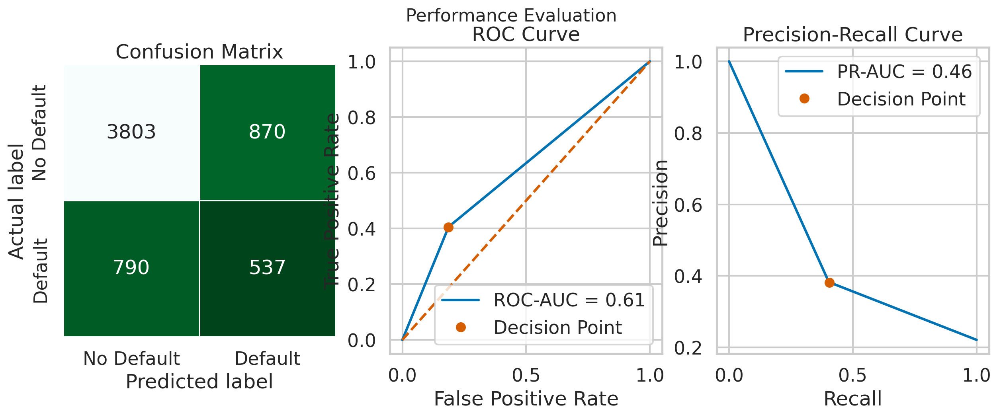

In [9]:
df = pd.read_csv("/content/credit_card_default.csv", na_values="")

X = df.copy()
y = X.pop("default_payment_next_month")

X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size=0.2,
                                                    stratify=y,
                                                    random_state=42)

num_features = X_train.select_dtypes(include="number").columns.to_list()
cat_features = X_train.select_dtypes(include="object").columns.to_list()

num_pipeline = Pipeline(steps=[
    ("imputer", SimpleImputer(strategy="median"))
])

cat_list = [list(X_train[col].dropna().unique()) for col in cat_features]

cat_pipeline = Pipeline(steps=[
    ("imputer", SimpleImputer(strategy="most_frequent")),
    ("onehot", OneHotEncoder(categories=cat_list, sparse=False,
                             handle_unknown="error", drop="first"))
])

preprocessor = ColumnTransformer(
    transformers=[
        ("numerical", num_pipeline, num_features),
        ("categorical", cat_pipeline, cat_features)
    ],
    remainder="drop"
)

tree_pipeline = Pipeline(
    steps=[("preprocessor", preprocessor),
           ("classifier", DecisionTreeClassifier(random_state=42))]
)

tree_pipeline.fit(X_train, y_train)

LABELS = ["No Default", "Default"]
tree_perf = performance_evaluation_report(tree_pipeline, X_test,
                                          y_test, labels=LABELS,
                                          show_plot=True,
                                          show_pr_curve=True)

In [10]:
print(f"Recall: {tree_perf['recall']:.4f}")

Recall: 0.4047


1. Import the libraries:

In [12]:
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from xgboost.sklearn import XGBClassifier
from lightgbm import LGBMClassifier

2. Define and fit the Random Forest pipeline:

--------------------------
----Evaluation metrics----
--------------------------
Accuracy: 0.8118
Precision: 0.6334
Recall (Sensitivity): 0.3542
Specificity: 0.9418
F1-Score: 0.4543
Cohen's Kappa: 0.3514
Recall: 0.3542


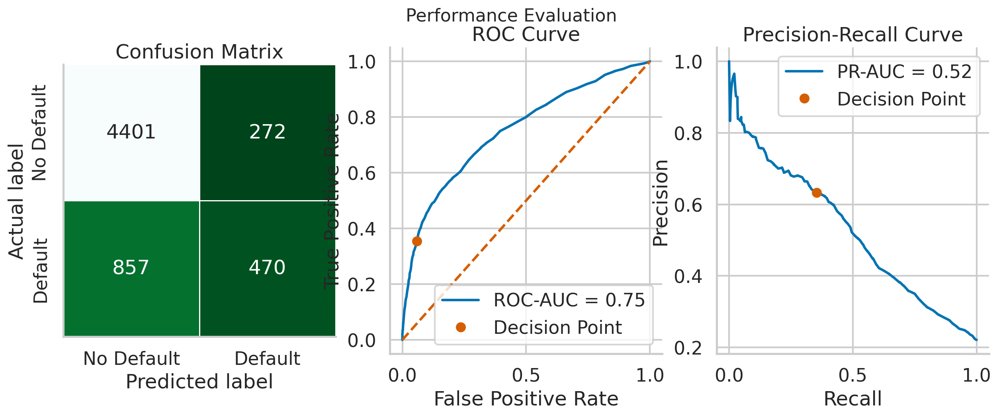

In [13]:
rf = RandomForestClassifier(random_state=42)
rf_pipeline = Pipeline(
    steps=[("preprocessor", preprocessor),
           ("classifier", rf)]
)

rf_pipeline.fit(X_train, y_train)
rf_perf = performance_evaluation_report(rf_pipeline, X_test,
                                        y_test, labels=LABELS,
                                        show_plot=True,
                                        show_pr_curve=True)

print(f"Recall: {rf_perf['recall']:.4f}")

sns.despine()

3. Define and fit the Gradient Boosted Trees pipeline:

--------------------------
----Evaluation metrics----
--------------------------
Accuracy: 0.8143
Precision: 0.6592
Recall (Sensitivity): 0.3323
Specificity: 0.9512
F1-Score: 0.4419
Cohen's Kappa: 0.3447
Recall: 0.3323


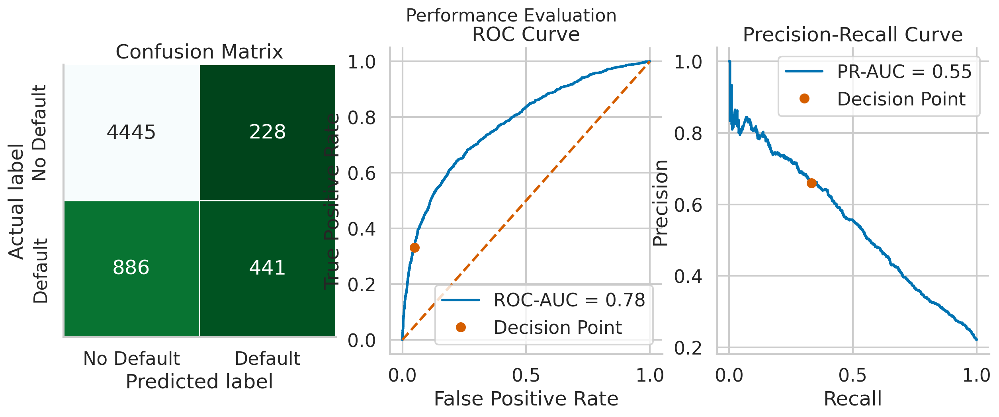

In [14]:
gbt = GradientBoostingClassifier(random_state=42)
gbt_pipeline = Pipeline(steps=[("preprocessor", preprocessor),
           ("classifier", gbt)])

gbt_pipeline.fit(X_train, y_train)
gbt_perf = performance_evaluation_report(gbt_pipeline, X_test,
                                         y_test, labels=LABELS,
                                         show_plot=True,
                                         show_pr_curve=True)

print(f"Recall: {gbt_perf['recall']:.4f}")
sns.despine()

4. Define and fit an XGBoost pipeline:

--------------------------
----Evaluation metrics----
--------------------------
Accuracy: 0.8097
Precision: 0.6235
Recall (Sensitivity): 0.3519
Specificity: 0.9397
F1-Score: 0.4499
Cohen's Kappa: 0.3454
Recall: 0.3519


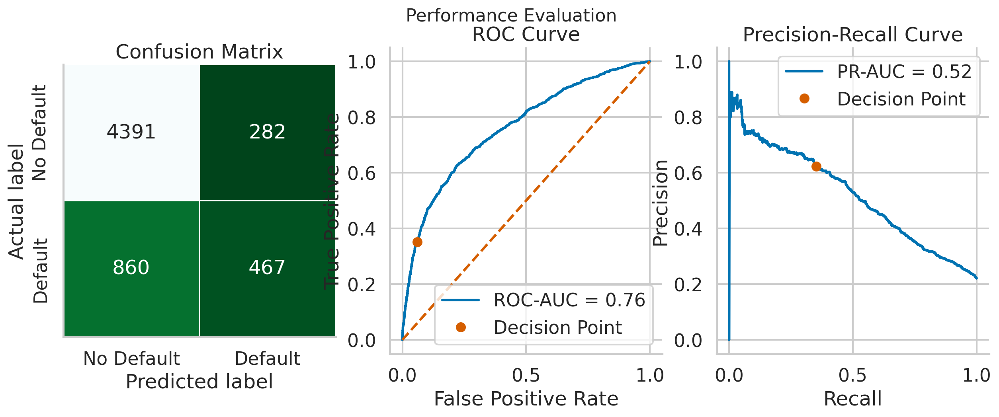

In [15]:
xgb = XGBClassifier(random_state=42)
xgb_pipeline = Pipeline(
    steps=[("preprocessor", preprocessor),
           ("classifier", xgb)]
)

xgb_pipeline.fit(X_train, y_train)
xgb_perf = performance_evaluation_report(xgb_pipeline, X_test,
                                         y_test, labels=LABELS,
                                         show_plot=True,
                                         show_pr_curve=True)

print(f"Recall: {xgb_perf['recall']:.4f}")

sns.despine()

5. Define and fit the LightGBM pipeline:

--------------------------
----Evaluation metrics----
--------------------------
Accuracy: 0.8173
Precision: 0.6576
Recall (Sensitivity): 0.3632
Specificity: 0.9463
F1-Score: 0.4680
Cohen's Kappa: 0.3686
Recall: 0.3632


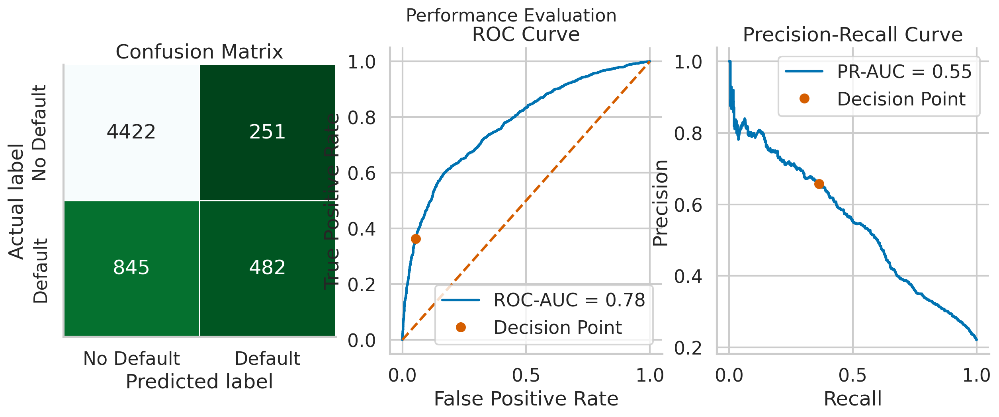

In [16]:
lgbm = LGBMClassifier(random_state=42)
lgbm_pipeline = Pipeline(
    steps=[("preprocessor", preprocessor),
           ("classifier", lgbm)]
)

lgbm_pipeline.fit(X_train, y_train)
lgbm_perf = performance_evaluation_report(lgbm_pipeline, X_test,
                                          y_test, labels=LABELS,
                                          show_plot=True,
                                          show_pr_curve=True)

print(f"Recall: {lgbm_perf['recall']:.4f}")

sns.despine()
# plt.savefig("images/figure_14_4", dpi=200)

In [17]:
from sklearn.model_selection import RandomizedSearchCV, StratifiedKFold
from sklearn import metrics
import numpy as np

N_SEARCHES = 100
k_fold = StratifiedKFold(5, shuffle=True, random_state=42)

## Hyperparameter tuning

**Random Forest**

When tuning the Random Forest classifier, we look at the following hyperparameters (there are more available for tuning):
* `n_estimators` - the number of decision trees in a forest. The goal is to find a balance between improved accuracy and computational cost.
* `max_features` - the maximum number of features considered for splitting a node. The default is the square root of the number of features. When None, all features are considered.
* `max_depth` - the maximum number of levels in each decision tree
* `min_samples_split` - the minimum number of observations required to split each node. When set to high it may cause underfitting, as the trees will not split enough times.
* `min_samples_leaf` - the minimum number of data points allowed in a leaf. Too small a value might cause overfitting, while large values might prevent the tree from growing and cause underfitting.
* `bootstrap` - whether to use bootstrapping for each tree in the forest

We define the grid below:

In [18]:
rf_param_grid = {
    "classifier__n_estimators": np.linspace(100, 500, 5, dtype=int),
    "classifier__max_features": ["log2", "sqrt", None],
    "classifier__max_depth": np.arange(3, 11, 1, dtype=int),
    "classifier__min_samples_split": [2, 5, 10],
    "classifier__min_samples_leaf": np.arange(1, 51, 2, dtype=int),
    "classifier__bootstrap": [True, False]
}

And use the randomized search to tune the classifier:

In [ ]:
rf_rs =  RandomizedSearchCV(rf_pipeline, rf_param_grid, scoring="recall",
                            cv=k_fold, n_jobs=-1, verbose=1,
                            n_iter=N_SEARCHES, random_state=42)

rf_rs.fit(X_train, y_train)

print(f"Best parameters: {rf_rs.best_params_}")
print(f"Recall (Training set): {rf_rs.best_score_:.4f}")
print(f"Recall (Test set): {metrics.recall_score(y_test, rf_rs.predict(X_test)):.4f}")

In [ ]:
rf_rs_perf = performance_evaluation_report(rf_rs, X_test,
                                           y_test, labels=LABELS,
                                           show_plot=True,
                                           show_pr_curve=True)

**Gradient Boosted Trees**

In [ ]:
gbt_param_grid = {
    "classifier__n_estimators": np.linspace(100, 500, 5, dtype=int),
    "classifier__learning_rate": np.arange(0.05, 0.31, 0.05),
    "classifier__max_depth": np.arange(3, 11, 1, dtype=int),
    "classifier__min_samples_split": np.linspace(0.1, 0.5, 12),
    "classifier__min_samples_leaf": np.arange(1, 51, 2, dtype=int),
    "classifier__max_features":["log2", "sqrt", None]
}

And run the randomized search:

In [ ]:
gbt_rs =  RandomizedSearchCV(gbt_pipeline, gbt_param_grid, scoring="recall",
                             cv=k_fold, n_jobs=-1, verbose=1,
                             n_iter=N_SEARCHES, random_state=42)

gbt_rs.fit(X_train, y_train)

print(f"Best parameters: {gbt_rs.best_params_}")
print(f"Recall (Training set): {gbt_rs.best_score_:.4f}")
print(f"Recall (Test set): {metrics.recall_score(y_test, gbt_rs.predict(X_test)):.4f}")

In [ ]:
gbt_rs_perf = performance_evaluation_report(gbt_rs, X_test,
                                            y_test, labels=LABELS,
                                            show_plot=True,
                                            show_pr_curve=True)

**XGBoost**

The scikit-learn API of XGBoost makes sure that the hyperparameters are named similarly to their equivalents other scikit-learn's classifiers. So the XGBoost native eta hyperparameter is called learning_rate in scikit-learn's API.

The new hyperparameters we consider for this example are:
* `min_child_weight` - indicates the minimum sum of weights of all observations required in a child. This hyperparameter is used for controlling overfitting. Cross-validation should be used for tuning.
* `colsample_bytree` - indicates the fraction of columns to be randomly sampled for each tree.

We define the grid as:

In [ ]:
xgb_param_grid = {
    "classifier__n_estimators": np.linspace(100, 500, 5, dtype=int),
    "classifier__learning_rate": np.arange(0.05, 0.31, 0.05),
    "classifier__max_depth": np.arange(3, 11, 1, dtype=int),
    "classifier__min_child_weight": np.arange(1, 8, 1, dtype=int),
    "classifier__colsample_bytree": np.linspace(0.3, 1, 7)
}

In [ ]:
xgb_rs =  RandomizedSearchCV(xgb_pipeline, xgb_param_grid, scoring="recall",
                             cv=k_fold, n_jobs=-1, verbose=1,
                             n_iter=N_SEARCHES, random_state=42)

xgb_rs.fit(X_train, y_train)

print(f"Best parameters: {xgb_rs.best_params_}")
print(f"Recall (Training set): {xgb_rs.best_score_:.4f}")
print(f"Recall (Test set): {metrics.recall_score(y_test, xgb_rs.predict(X_test)):.4f}")

In [ ]:
xgb_rs_perf = performance_evaluation_report(xgb_rs, X_test,
                                            y_test, labels=LABELS,
                                            show_plot=True,
                                            show_pr_curve=True)

**LightGBM**

In [ ]:
lgbm_param_grid = {
    "classifier__n_estimators": np.linspace(100, 500, 5, dtype=int),
    "classifier__learning_rate": np.arange(0.05, 0.31, 0.05),
    "classifier__max_depth": np.arange(3, 11, 1, dtype=int),
    "classifier__colsample_bytree": np.linspace(0.3, 1, 7)
}

In [ ]:
lgbm_rs =  RandomizedSearchCV(lgbm_pipeline, lgbm_param_grid, scoring="recall",
                              cv=k_fold, n_jobs=-1, verbose=1,
                              n_iter=N_SEARCHES, random_state=42)

lgbm_rs.fit(X_train, y_train)

print(f"Best parameters: {lgbm_rs.best_params_}")
print(f"Recall (Training set): {lgbm_rs.best_score_:.4f}")
print(f"Recall (Test set): {metrics.recall_score(y_test, lgbm_rs.predict(X_test)):.4f}")

In [ ]:
lgbm_rs_perf = performance_evaluation_report(lgbm_rs, X_test,
                                             y_test, labels=LABELS,
                                             show_plot=True,
                                             show_pr_curve=True)

In [ ]:
#performance Summary
results_dict = {
    "decision_tree_baseline": tree_perf,
    "random_forest": rf_perf,
    "random_forest_rs": rf_rs_perf,
    "gradient_boosted_trees": gbt_perf,
    "gradient_boosted_trees_rs": gbt_rs_perf,
    "xgboost": xgb_perf,
    "xgboost_rs": xgb_rs_perf,
    "light_gbm": lgbm_perf,
    "light_gbm_rs": lgbm_rs_perf
}

results_comparison = pd.DataFrame(results_dict).T
results_comparison

## Alternative Approaches to Handling Categorical Data, Work with `category_encoders`

### Drawback of OneHot Encoding:
- dimensional quick expansion
- create many boolean features introduces *sparisity* to dataset
- continuous features have **higher feature importance** than one-hot encoding dummy features
- decision trees splitting trick treats all one-hot-encoded dummies as *independent features*, leading to a **small gain in purity** per split if only use one of the dummy variables.
- For a continuous variable, a binary feature can only split in one place, while categorical features can split samples with order list anywhere

### Alternative Ways

- #### Target(Mean) Encoding
  - Procedure
    - **Categorical Target**: replaced with a mixture of <u>posterior</u> probability of the target given a certain category and <u>prior</u> probability of the target over all training data.
    - **Continuous Target**: replaced with a mixture of <u>expected value</u> of the target <u>given a certain category</u> and the expected value of target *over all training dataset*.
  - **Greedy target encoding**: simply replace the category with <u>mean value</u> of target label over all training samples **with the same category**. Then map the mean values into test data.
    - Disadvantage:
      - easy to overfit
      - easy to lack target information into features
  - **Holdout target encoding**: split training data into 2 parts. The first part is to calculate mean value(or other statistics), another is to do model training.
    - No information leaking
    - But useful training data to feed model becomes less. When using this method in small dataset, it is not a good choice.
  - **K-fold target encoding**: divide data into k-fold stratifiedly or randomly.Then replace the observation presents in i-th fold with mean from all other k-1 folds.
    - use all efficient information
    - reduce overfitting problem

- #### Leaving One Out Encoding(LOOE)
  - Improvement:
    - for reducing overfitting problem and avoiding row-wise leakage, it <u>excludes the current row target value</u> when calculating the category mean.
    - it performs well in small dataset.

- #### Weight of Evidence(WoE) or called Information Value(IV)
  - calculated as natural logarithm of odds ratio
    - $WoE=ln(\frac{\%payBack}{\%failPayBack})$
  - intuition:
    - indicate the **predictive power** of an independent variable in relation to the target.
    - in this case, it uses to separate customers who pay back successfully and who fail.
  - drawback: it can only used on <u>binary categorical target</u>.
  


Prepare the Pipeline:

In [19]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.tree import DecisionTreeClassifier
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier

--------------------------
----Evaluation metrics----
--------------------------
Accuracy: 0.8118
Precision: 0.6334
Recall (Sensitivity): 0.3542
Specificity: 0.9418
F1-Score: 0.4543
Cohen's Kappa: 0.3514


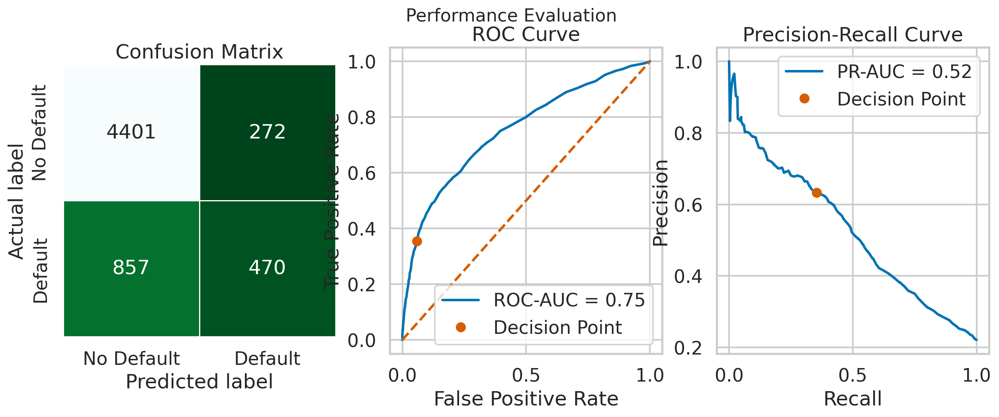

In [20]:
df = pd.read_csv("/content/credit_card_default.csv", na_values="")

X = df.copy()
y = X.pop("default_payment_next_month")

X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size=0.2,
                                                    stratify=y,
                                                    random_state=42)

num_features = X_train.select_dtypes(include="number").columns.to_list()
cat_features = X_train.select_dtypes(include="object").columns.to_list()

num_pipeline = Pipeline(steps=[
    ("imputer", SimpleImputer(strategy="median"))
])

cat_list = [list(X_train[col].dropna().unique()) for col in cat_features]

cat_pipeline = Pipeline(steps=[
    ("imputer", SimpleImputer(strategy="most_frequent")),
    ("cat_encoding", OneHotEncoder(categories=cat_list, sparse=False,
                             handle_unknown="error", drop="first"))
])

preprocessor = ColumnTransformer(
    transformers=[
        ("numerical", num_pipeline, num_features),
        ("categorical", cat_pipeline, cat_features)
    ],
    remainder="drop"
)

rf_pipeline = Pipeline(
    steps=[("preprocessor", preprocessor),
           ("classifier", RandomForestClassifier(random_state=42))]
)

rf_pipeline.fit(X_train, y_train)

LABELS = ["No Default", "Default"]
rf_perf = performance_evaluation_report(rf_pipeline, X_test,
                                        y_test, labels=LABELS,
                                        show_plot=True,
                                        show_pr_curve=True)

In [21]:
rf_perf

{'accuracy': 0.8118333333333333,
 'precision': 0.633423180592992,
 'recall': 0.3541823662396383,
 'specificity': 0.941793280547828,
 'f1_score': 0.4543257612373127,
 'cohens_kappa': 0.35144338792034113,
 'roc_auc': 0.7517763463762952,
 'pr_auc': 0.5247244574365608}

In [22]:
print(f"Recall: {rf_perf['recall']:.4f}")

Recall: 0.3542


In [23]:
!pip install category_encoders
import category_encoders as ce
from sklearn.base import clone

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.9/81.9 kB 3.2 MB/s eta 0:00:00


2. Fit the pipeline using target encoding:

--------------------------
----Evaluation metrics----
--------------------------
Accuracy: 0.8138
Precision: 0.6374
Recall (Sensitivity): 0.3670
Specificity: 0.9407
F1-Score: 0.4658
Cohen's Kappa: 0.3628
Recall: 0.3670


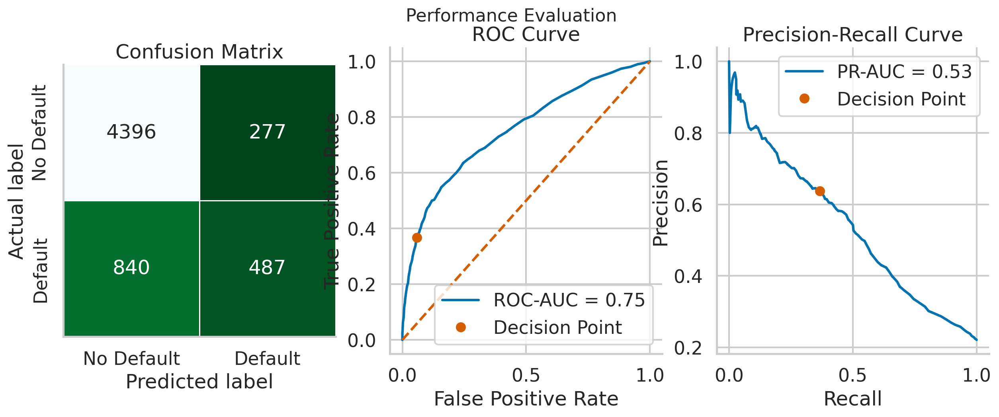

In [24]:
pipeline_target_enc = clone(rf_pipeline)
pipeline_target_enc.set_params(
    preprocessor__categorical__cat_encoding=ce.TargetEncoder()
)

pipeline_target_enc.fit(X_train, y_train)
target_enc_perf = performance_evaluation_report(
    pipeline_target_enc, X_test,
    y_test, labels=LABELS,
    show_plot=True,
    show_pr_curve=True
)
print(f"Recall: {target_enc_perf['recall']:.4f}")

sns.despine()

3. Fit the pipeline using Leave One Out encoding:

--------------------------
----Evaluation metrics----
--------------------------
Accuracy: 0.7968
Precision: 0.6929
Recall (Sensitivity): 0.1462
Specificity: 0.9816
F1-Score: 0.2414
Cohen's Kappa: 0.1781
Recall: 0.1462


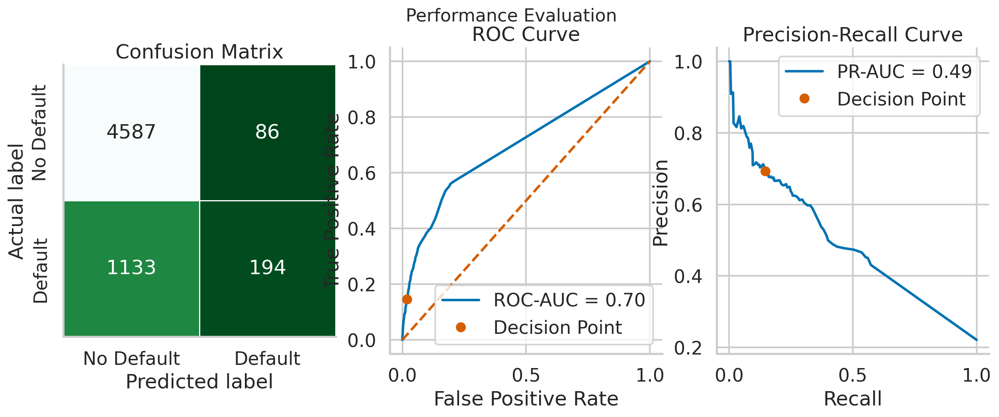

In [25]:
pipeline_loo_enc = clone(rf_pipeline)
pipeline_loo_enc.set_params(
    preprocessor__categorical__cat_encoding=ce.LeaveOneOutEncoder()
)

pipeline_loo_enc.fit(X_train, y_train)
loo_enc_perf = performance_evaluation_report(
    pipeline_loo_enc, X_test,
    y_test, labels=LABELS,
    show_plot=True,
    show_pr_curve=True
)
print(f"Recall: {loo_enc_perf['recall']:.4f}")

sns.despine()

--------------------------
----Evaluation metrics----
--------------------------
Accuracy: 0.8165
Precision: 0.6633
Recall (Sensitivity): 0.3459
Specificity: 0.9501
F1-Score: 0.4547
Cohen's Kappa: 0.3572
Recall: 0.3459


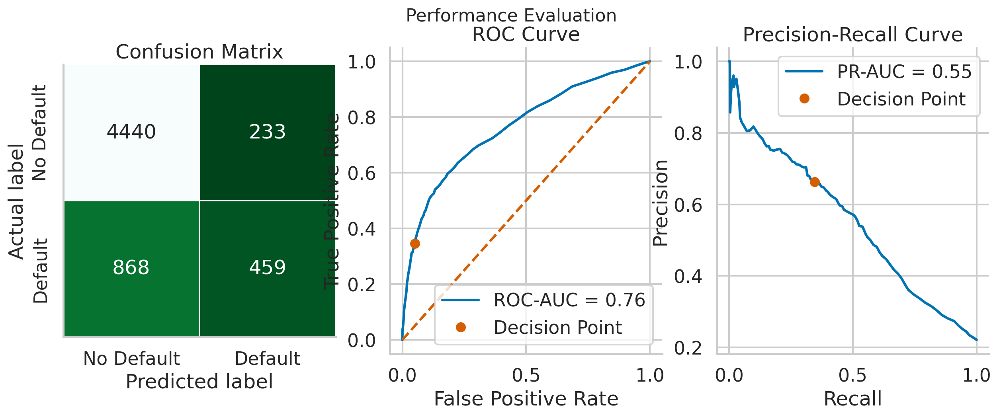

In [26]:
# testing if we can improve the performance by adding random noise
pipeline_loo_enc = clone(rf_pipeline)
pipeline_loo_enc.set_params(
    preprocessor__categorical__cat_encoding=ce.LeaveOneOutEncoder(sigma=0.05, random_state=42)
)

pipeline_loo_enc.fit(X_train, y_train)
loo_enc_perf = performance_evaluation_report(
    pipeline_loo_enc, X_test,
    y_test, labels=LABELS,
    show_plot=True,
    show_pr_curve=True
)
print(f"Recall: {loo_enc_perf['recall']:.4f}")

sns.despine()

4. Fit the pipeline using Weight of Evidence encoding:

--------------------------
----Evaluation metrics----
--------------------------
Accuracy: 0.8147
Precision: 0.6398
Recall (Sensitivity): 0.3708
Specificity: 0.9407
F1-Score: 0.4695
Cohen's Kappa: 0.3667
Recall: 0.3708


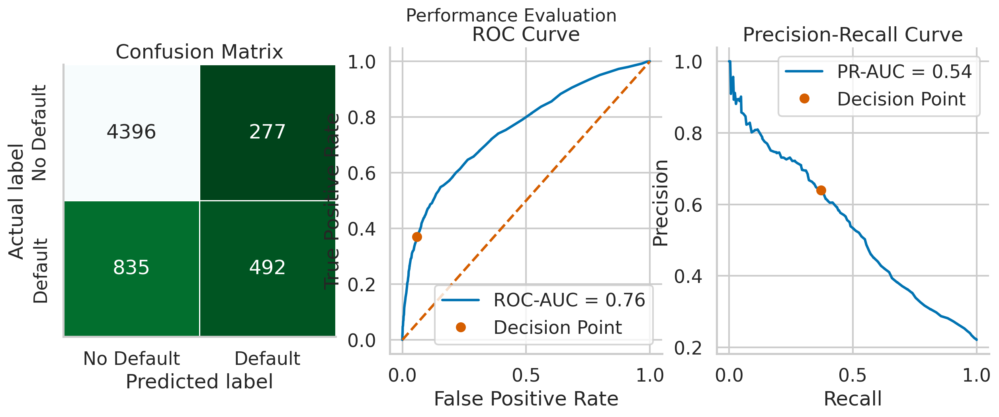

In [27]:
pipeline_woe_enc = clone(rf_pipeline)
pipeline_woe_enc.set_params(
    preprocessor__categorical__cat_encoding=ce.WOEEncoder()
)

pipeline_woe_enc.fit(X_train, y_train)
woe_enc_perf = performance_evaluation_report(
    pipeline_woe_enc, X_test,
    y_test, labels=LABELS,
    show_plot=True,
    show_pr_curve=True
)
print(f"Recall: {woe_enc_perf['recall']:.4f}")

sns.despine()

## Handling Imbalanced Data--resample

- ### Oversampling
  - Random oversampling
  - SMOTE
    - SMOTE-NC
    - Borderline SMOTE
    - SVM SMOTE
    - K-Means SMOTE
  - ADASYN

- ### Undersampling
  - Random undersampling
  - NearMiss
  - Edited Nearest Neighbors
  - Tomek Links

1. Import the libraries:

In [28]:
import pandas as pd
from collections import Counter

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import RobustScaler

from imblearn.over_sampling import RandomOverSampler, SMOTE, ADASYN
from imblearn.under_sampling import RandomUnderSampler
from imblearn.ensemble import BalancedRandomForestClassifier

2. Load and prepare data:

In [36]:
RANDOM_STATE = 42

df = pd.read_csv("/content/default of credit card clients.csv")

X = df.copy()
y = X.pop("default payment next month")

X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.2,
    stratify=y,
    random_state=RANDOM_STATE
)

In [37]:
y.value_counts(normalize=True)

0    0.7788
1    0.2212
Name: default payment next month, dtype: float64

3. Scale the features using `RobustScaler`

- `StandardScaler`: set mean=0, variance=1
- `MinMaxScaler`: scale all data into range $[-1,1]$
- `RobustScaler`: remove outlier with quantiles setting. By default, it uses interquantile range to robust outliers.

In [38]:
robust_scaler = RobustScaler()

X_train = robust_scaler.fit_transform(X_train)
X_test = robust_scaler.transform(X_test)

4. Train the baseline model:

In [39]:
rf = RandomForestClassifier(
    random_state=RANDOM_STATE, n_jobs=-1
)
rf.fit(X_train, y_train)

RandomForestClassifier(n_jobs=-1, random_state=42)

--------------------------
----Evaluation metrics----
--------------------------
Accuracy: 0.8118
Precision: 0.6316
Recall (Sensitivity): 0.3580
Specificity: 0.9407
F1-Score: 0.4570
Cohen's Kappa: 0.3535


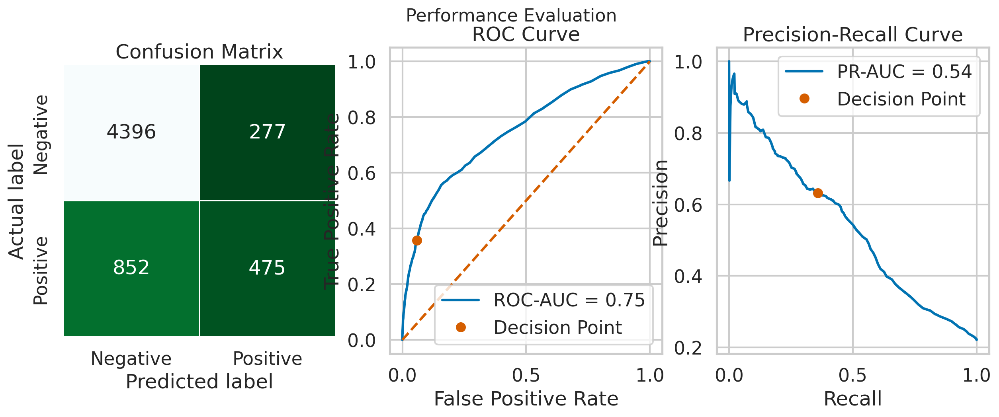

In [40]:
rf_perf = performance_evaluation_report(rf, X_test, y_test,
                                        show_plot=True,
                                        show_pr_curve=True)

In [41]:
rf_perf

{'accuracy': 0.8118333333333333,
 'precision': 0.6316489361702128,
 'recall': 0.3579502637528259,
 'specificity': 0.9407233040873101,
 'f1_score': 0.45695045695045694,
 'cohens_kappa': 0.35351442309894676,
 'roc_auc': 0.7506150953601401,
 'pr_auc': 0.5353899706056906}

5. Undersample the training data and train a Random Forest Classifier:
- https://imbalanced-learn.org/stable/references/generated/imblearn.under_sampling.RandomUnderSampler.html#imblearn.under_sampling.RandomUnderSampler

The new class proportions are: {0: 5309, 1: 5309}
--------------------------
----Evaluation metrics----
--------------------------
Accuracy: 0.7412
Precision: 0.4396
Recall (Sensitivity): 0.6194
Specificity: 0.7757
F1-Score: 0.5142
Cohen's Kappa: 0.3447


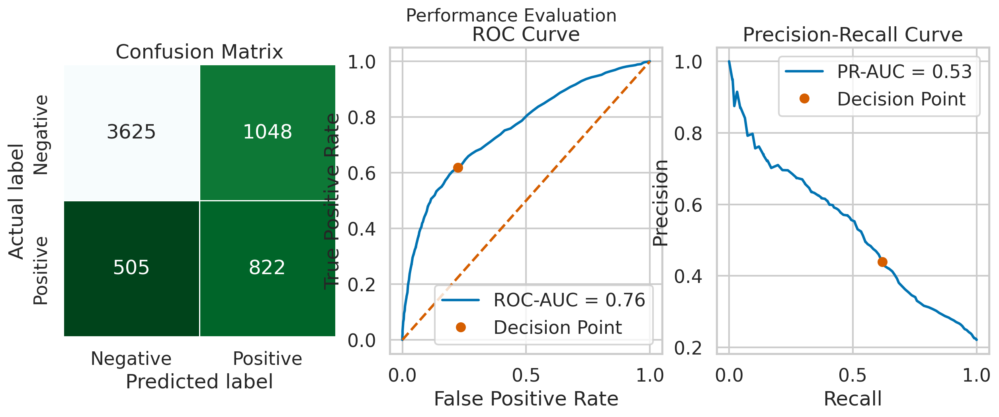

In [42]:
rus = RandomUnderSampler(random_state=RANDOM_STATE)
X_rus, y_rus = rus.fit_resample(X_train, y_train)
print(f"The new class proportions are: {dict(Counter(y_rus))}")

rf.fit(X_rus, y_rus)
rf_rus_perf = performance_evaluation_report(rf, X_test, y_test,
                                            show_plot=True,
                                            show_pr_curve=True)

In [43]:
rf_rus_perf

{'accuracy': 0.7411666666666666,
 'precision': 0.439572192513369,
 'recall': 0.6194423511680482,
 'specificity': 0.7757329338754547,
 'f1_score': 0.5142320925868002,
 'cohens_kappa': 0.3446805757358805,
 'roc_auc': 0.7582874796950398,
 'pr_auc': 0.5302458386783102}

6. Oversample the training data and train a Random Forest Classifier:

The new class proportions are: {0: 18691, 1: 18691}
--------------------------
----Evaluation metrics----
--------------------------
Accuracy: 0.8067
Precision: 0.5878
Recall (Sensitivity): 0.4213
Specificity: 0.9161
F1-Score: 0.4908
Cohen's Kappa: 0.3755


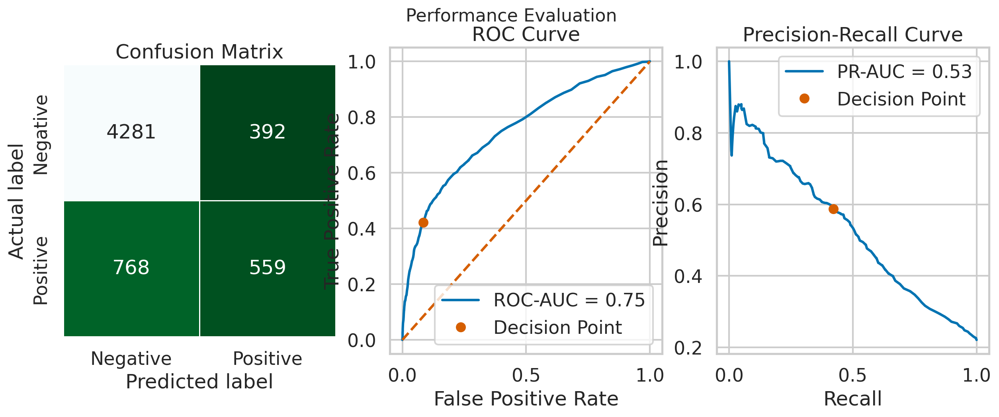

In [44]:
ros = RandomOverSampler(random_state=RANDOM_STATE)
X_ros, y_ros = ros.fit_resample(X_train, y_train)
print(f"The new class proportions are: {dict(Counter(y_ros))}")

rf.fit(X_ros, y_ros)
rf_ros_perf = performance_evaluation_report(rf, X_test, y_test,
                                            show_plot=True,
                                            show_pr_curve=True)


In [45]:
rf_ros_perf

{'accuracy': 0.8066666666666666,
 'precision': 0.5878023133543638,
 'recall': 0.4212509419743783,
 'specificity': 0.9161138454953991,
 'f1_score': 0.49078138718173836,
 'cohens_kappa': 0.3754512499320265,
 'roc_auc': 0.7548188046871258,
 'pr_auc': 0.5286813740311043}

7. Oversample the training data using SMOTE:

The new class proportions are: {0: 18691, 1: 18691}
--------------------------
----Evaluation metrics----
--------------------------
Accuracy: 0.7997
Precision: 0.5560
Recall (Sensitivity): 0.4680
Specificity: 0.8939
F1-Score: 0.5082
Cohen's Kappa: 0.3836


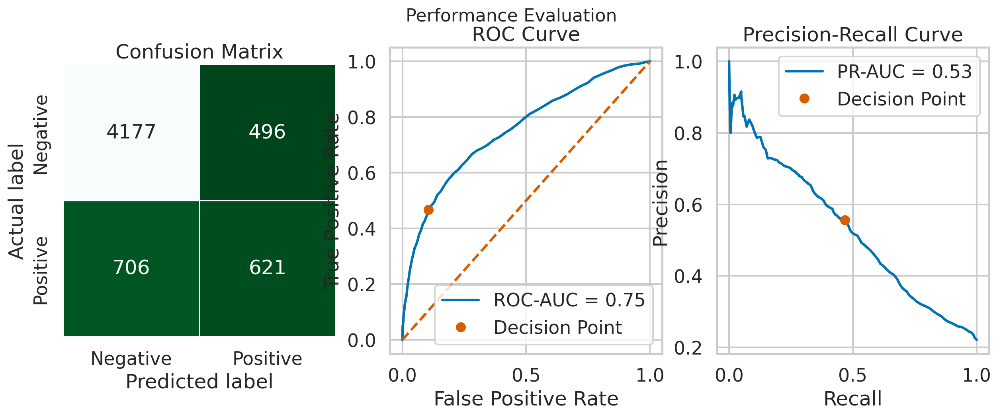

In [46]:
smote = SMOTE(random_state=RANDOM_STATE)
X_smote, y_smote = smote.fit_resample(X_train, y_train)
print(f"The new class proportions are: {dict(Counter(y_smote))}")

rf.fit(X_smote, y_smote)
rf_smote_perf = performance_evaluation_report(
    rf, X_test, y_test,
    show_plot=True,
    show_pr_curve=True
)


In [47]:
rf_smote_perf

{'accuracy': 0.7996666666666666,
 'precision': 0.5559534467323187,
 'recall': 0.46797287113790503,
 'specificity': 0.8938583351166275,
 'f1_score': 0.5081833060556464,
 'cohens_kappa': 0.38356245173931636,
 'roc_auc': 0.7524792088334418,
 'pr_auc': 0.5275934564213045}

8. Oversample the training data using ADASYN:

The new class proportions are: {0: 18691, 1: 18244}
--------------------------
----Evaluation metrics----
--------------------------
Accuracy: 0.7937
Precision: 0.5391
Recall (Sensitivity): 0.4619
Specificity: 0.8879
F1-Score: 0.4976
Cohen's Kappa: 0.3687


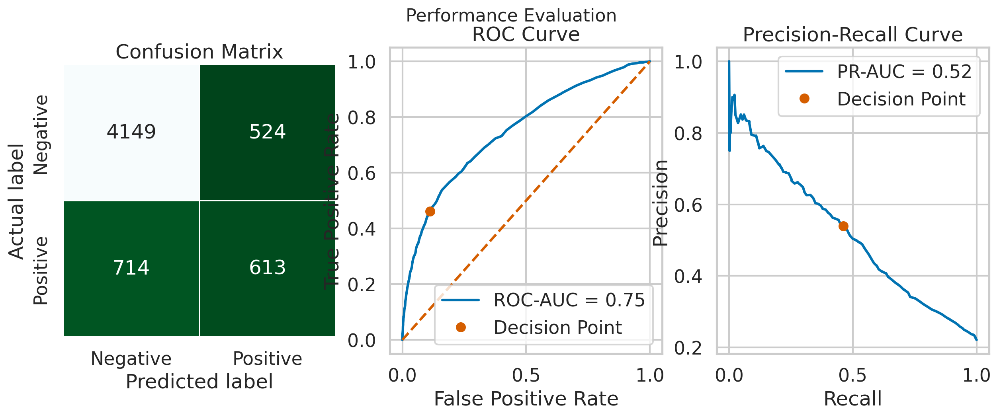

In [48]:
adasyn = ADASYN(random_state=RANDOM_STATE)
X_adasyn, y_adasyn = adasyn.fit_resample(X_train, y_train)
print(f"The new class proportions are: {dict(Counter(y_adasyn))}")

rf.fit(X_adasyn, y_adasyn)
rf_adasyn_perf = performance_evaluation_report(
    rf, X_test, y_test,
    show_plot=True,
    show_pr_curve=True
)

In [49]:
rf_adasyn_perf

{'accuracy': 0.7936666666666666,
 'precision': 0.5391380826737028,
 'recall': 0.4619442351168048,
 'specificity': 0.8878664669377274,
 'f1_score': 0.4975649350649351,
 'cohens_kappa': 0.36871101293326536,
 'roc_auc': 0.7503379658126796,
 'pr_auc': 0.5169162996430611}

9. Use sample weights in the Random Forest Classifier:

--------------------------
----Evaluation metrics----
--------------------------
Accuracy: 0.8130
Precision: 0.6458
Recall (Sensitivity): 0.3421
Specificity: 0.9467
F1-Score: 0.4473
Cohen's Kappa: 0.3473


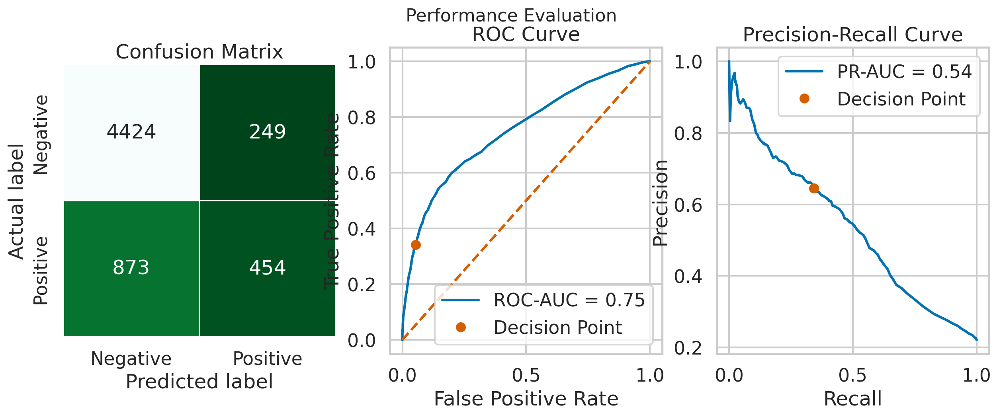

In [50]:
rf_cw = RandomForestClassifier(random_state=RANDOM_STATE,
                               class_weight="balanced",
                               n_jobs=-1)
rf_cw.fit(X_train, y_train)

rf_cw_perf = performance_evaluation_report(
    rf_cw, X_test, y_test,
    show_plot=True,
    show_pr_curve=True
)

In [51]:
rf_cw_perf

{'accuracy': 0.813,
 'precision': 0.6458036984352774,
 'recall': 0.3421250941974378,
 'specificity': 0.9467151722662102,
 'f1_score': 0.44729064039408867,
 'cohens_kappa': 0.3473100000213297,
 'roc_auc': 0.7517101481340885,
 'pr_auc': 0.5351725300244403}

10. Train the `BalancedRandomForestClassifier`:

/usr/local/lib/python3.10/dist-packages/sklearn/utils/parallel.py:114: UserWarning: `sklearn.utils.parallel.delayed` should be used with `sklearn.utils.parallel.Parallel` to make it possible to propagate the scikit-learn configuration of the current thread to the joblib workers.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/utils/parallel.py:114: UserWarning: `sklearn.utils.parallel.delayed` should be used with `sklearn.utils.parallel.Parallel` to make it possible to propagate the scikit-learn configuration of the current thread to the joblib workers.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/utils/parallel.py:114: UserWarning: `sklearn.utils.parallel.delayed` should be used with `sklearn.utils.parallel.Parallel` to make it possible to propagate the scikit-learn configuration of the current thread to the joblib workers.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/utils/parallel.py:114: UserWarning: `sklearn.utils.parallel.d

--------------------------
----Evaluation metrics----
--------------------------
Accuracy: 0.7425
Precision: 0.4416
Recall (Sensitivity): 0.6217
Specificity: 0.7768
F1-Score: 0.5164
Cohen's Kappa: 0.3477


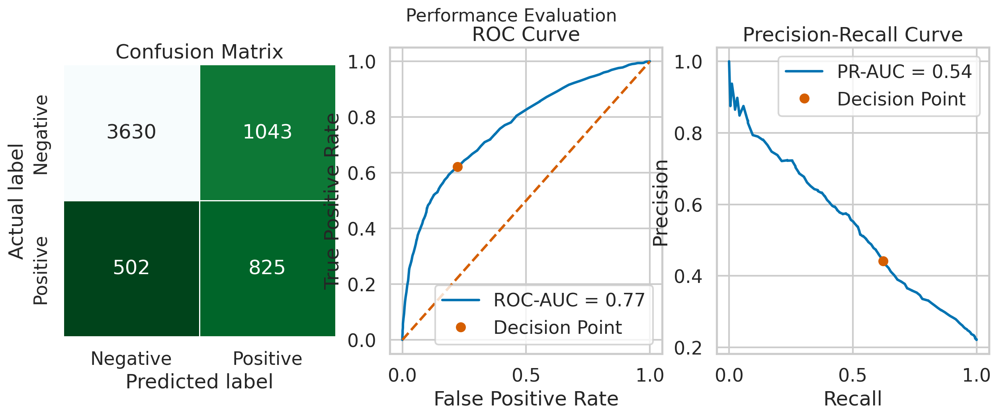

In [52]:
balanced_rf = BalancedRandomForestClassifier(
    random_state=RANDOM_STATE
)

balanced_rf.fit(X_train, y_train)
balanced_rf_perf = performance_evaluation_report(
    balanced_rf, X_test, y_test,
    show_plot=True,
    show_pr_curve=True
)

11. Train the `BalancedRandomForestClassifier` with balanced classes:

/usr/local/lib/python3.10/dist-packages/sklearn/utils/parallel.py:114: UserWarning: `sklearn.utils.parallel.delayed` should be used with `sklearn.utils.parallel.Parallel` to make it possible to propagate the scikit-learn configuration of the current thread to the joblib workers.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/utils/parallel.py:114: UserWarning: `sklearn.utils.parallel.delayed` should be used with `sklearn.utils.parallel.Parallel` to make it possible to propagate the scikit-learn configuration of the current thread to the joblib workers.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/utils/parallel.py:114: UserWarning: `sklearn.utils.parallel.delayed` should be used with `sklearn.utils.parallel.Parallel` to make it possible to propagate the scikit-learn configuration of the current thread to the joblib workers.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/utils/parallel.py:114: UserWarning: `sklearn.utils.parallel.d

--------------------------
----Evaluation metrics----
--------------------------
Accuracy: 0.7538
Precision: 0.4569
Recall (Sensitivity): 0.5991
Specificity: 0.7978
F1-Score: 0.5184
Cohen's Kappa: 0.3571


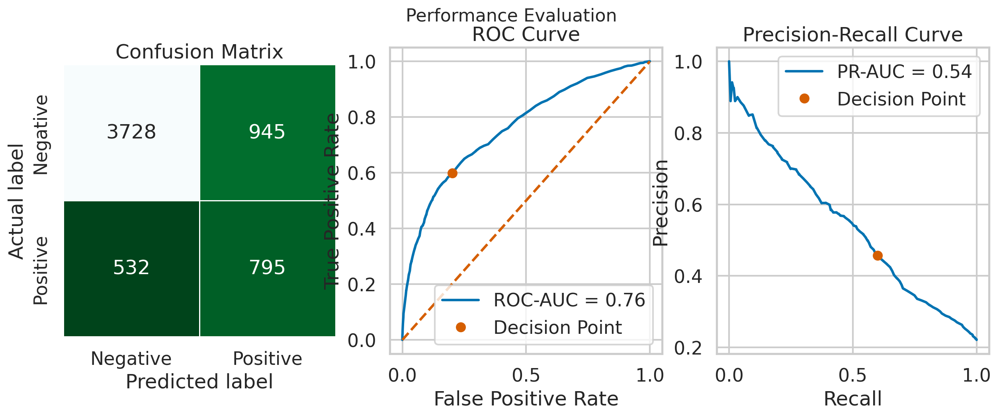

In [53]:
balanced_rf_cw = BalancedRandomForestClassifier(
    random_state=RANDOM_STATE,
    class_weight="balanced",
    n_jobs=-1
)

balanced_rf_cw.fit(X_train, y_train)
balanced_rf_cw_perf = performance_evaluation_report(
    balanced_rf_cw, X_test, y_test,
    show_plot=True,
    show_pr_curve=True
)

12. Combine the results in a DataFrame:

In [54]:
performance_results = {
    "random_forest": rf_perf,
    "undersampled rf": rf_rus_perf,
    "oversampled_rf": rf_ros_perf,
    "smote": rf_smote_perf,
    "adasyn": rf_adasyn_perf,
    "random_forest_cw": rf_cw_perf,
    "balanced_random_forest": balanced_rf_perf,
    "balanced_random_forest_cw": balanced_rf_cw_perf,
}
pd.DataFrame(performance_results).round(4).T

,accuracy,precision,recall,specificity,f1_score,cohens_kappa,roc_auc,pr_auc
random_forest,0.8118,0.6316,0.3580,0.9407,0.4570,0.3535,0.7506,0.5354
undersampled rf,0.7412,0.4396,0.6194,0.7757,0.5142,0.3447,0.7583,0.5302
oversampled_rf,0.8067,0.5878,0.4213,0.9161,0.4908,0.3755,0.7548,0.5287
smote,0.7997,0.5560,0.4680,0.8939,0.5082,0.3836,0.7525,0.5276
adasyn,0.7937,0.5391,0.4619,0.8879,0.4976,0.3687,0.7503,0.5169
random_forest_cw,0.8130,0.6458,0.3421,0.9467,0.4473,0.3473,0.7517,0.5352
balanced_random_forest,0.7425,0.4416,0.6217,0.7768,0.5164,0.3477,0.7669,0.5408
balanced_random_forest_cw,0.7538,0.4569,0.5991,0.7978,0.5184,0.3571,0.7616,0.5394


## Leveraging the Wisdom of the Crowds with Stacked Ensembles
- Stacking:
  - Component: data → >=2 base models to make predictions(Level0) → meta model(Level1) → final prediction
  - leverage different strengths of base models

1. Import the libraries:

In [55]:
import pandas as pd
from sklearn.model_selection import (train_test_split,
                                     StratifiedKFold)
from sklearn.metrics import recall_score
from sklearn.preprocessing import RobustScaler

from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import StackingClassifier

2. Load and preprocess data:

In [57]:
RANDOM_STATE = 42

df = pd.read_csv("/content/default of credit card clients.csv")

X = df.copy()
y = X.pop("default payment next month")

X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.2,
    stratify=y,
    random_state=RANDOM_STATE
)

robust_scaler = RobustScaler()
X_train = robust_scaler.fit_transform(X_train)
X_test = robust_scaler.transform(X_test)

3. Define a list of base models:

In [58]:
base_models = [
    ("dec_tree", DecisionTreeClassifier(random_state=RANDOM_STATE)),
    ("log_reg", LogisticRegression(random_state=RANDOM_STATE)),
    ("svc", SVC(random_state=RANDOM_STATE)),
    ("naive_bayes", GaussianNB())
]

4. Train the selected models and calculate recall using the test set:

In [59]:
for model_tuple in base_models:
    clf = model_tuple[1]
    if "n_jobs" in clf.get_params().keys():
        clf.set_params(n_jobs=-1)
    clf.fit(X_train, y_train)
    recall = recall_score(y_test, clf.predict(X_test))
    print(f"{model_tuple[0]}'s recall score: {recall:.4f}")

dec_tree's recall score: 0.4122
log_reg's recall score: 0.2396
svc's recall score: 0.3188
naive_bayes's recall score: 0.5539


5. Define, fit and evaluate the stacked ensemble:

In [60]:
cv_scheme = StratifiedKFold(n_splits=5,
                            shuffle=True,
                            random_state=RANDOM_STATE)
meta_model = LogisticRegression(random_state=RANDOM_STATE)

stack_clf = StackingClassifier(
    base_models,
    final_estimator=meta_model,
    cv=cv_scheme,
    n_jobs=-1
)
stack_clf.fit(X_train, y_train)

recall = recall_score(y_test, stack_clf.predict(X_test))
print(f"The stacked ensemble's recall score: {recall:.4f}")

The stacked ensemble's recall score: 0.3429


- Reasons for choosing linear models as meta model:
  - Meta model is usually **simple and provides smooth interpretation** of predictions from level0 models
  - the prediction of level1 model is a <u>weighted average/blending</u> of predictions from level0s.

6. Improve the stacking ensemble with additional features and a more complex meta model:

In [61]:
meta_model = RandomForestClassifier(random_state=RANDOM_STATE)
stack_clf = StackingClassifier(
    base_models,
    final_estimator=meta_model,
    cv=cv_scheme,
    passthrough=True,
    n_jobs=-1
)
stack_clf.fit(X_train, y_train)

recall = recall_score(y_test, stack_clf.predict(X_test))
print(f"The stacked ensemble's recall score: {recall:.4f}")

The stacked ensemble's recall score: 0.3693


## Bayesian Hyperparameter Optimization with AutoML

### Concept
- It keeps track of <u>past evaluaton results</u> which they use to form a probabilistic model(called `surrogate model`) mapping **hyperparameters** to a **score** on objective function:  $P(score|hyperparameter)$
- Procedures:
  - build a surrogate model of true objective function
    - surrogate model: created using **Tree-Structured Parzen Estimator(TPE)** or random forest regression, gaussian processes
  - find surrogate model's best performed parameter set.
  - apply these found parameters to true objective function
  - update surrogate model, which makes it much more approximates to the true objective function.
  - iteration until pre-set iterations or time is reached.

### Sequential Model-Based Optimization(SMBO)
- formalization of bayesian optimization
- Steps:
  1. determine the hyperparameter domain
  2. objective function whose inputs are hyperparameters and outputs a score we can minimize or maximize
    - eg: we choose `Root Mean Squared Error` as objective functon
  3. build the surrogate model of objective function
  4. set up a selection function(threshold) to decide which hyperparameters to choose next from surrogate model
    - most common one: Expected Improvement(maximize)
  5. update surrogate model using historical hyperparameter pairs and scores.


1. Load the libraries:

In [62]:
import pickle
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold

!pip install hyperopt
import hyperopt
from hyperopt import hp, fmin, tpe, STATUS_OK, Trials, space_eval
from hyperopt.pyll import scope
from hyperopt.pyll.stochastic import sample

2. Define parameters for later use:

In [63]:
N_FOLDS = 5
MAX_EVALS = 200
RANDOM_STATE = 42
EVAL_METRIC = "recall"
DEBUG = False

3. Load and prepare the data:

In [64]:
df = pd.read_csv("/content/default of credit card clients.csv")

X = df.copy()
y = X.pop("default payment next month")

X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.2,
    stratify=y,
    random_state=RANDOM_STATE
)

4. Train the benchmark LightGBM model with the default hyperparameters:

--------------------------
----Evaluation metrics----
--------------------------
Accuracy: 0.8187
Precision: 0.6671
Recall (Sensitivity): 0.3595
Specificity: 0.9491
F1-Score: 0.4672
Cohen's Kappa: 0.3695
Recall: 0.3595


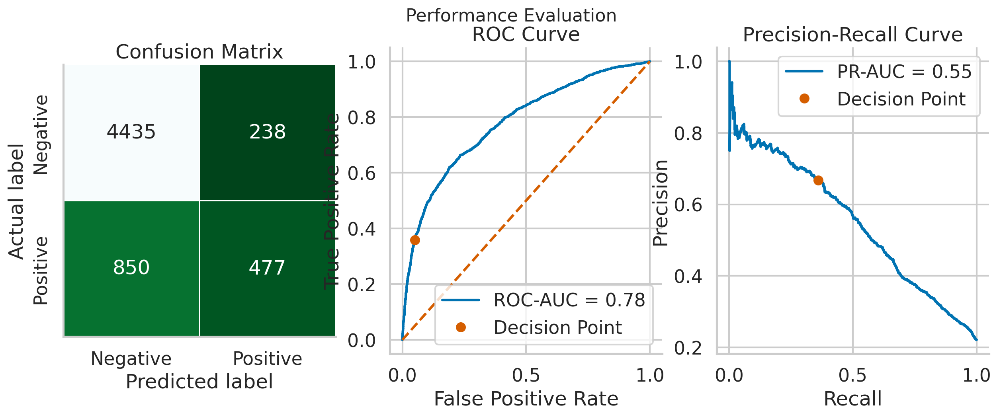

In [65]:
clf = LGBMClassifier(random_state=RANDOM_STATE)
clf.fit(X_train, y_train)

benchmark_perf = performance_evaluation_report(
    clf, X_test, y_test,
    show_plot=True,
    show_pr_curve=True
)
print(f'Recall: {benchmark_perf["recall"]:.4f}')

sns.despine()

5. Define the objective function:

In [66]:
def objective(params, n_folds=N_FOLDS,
              random_state=RANDOM_STATE,
              metric=EVAL_METRIC):

    # useful for debugging
    if DEBUG:
        print(params)

    model = LGBMClassifier(**params, random_state=random_state)
    k_fold = StratifiedKFold(n_folds, shuffle=True,
                             random_state=random_state)

    scores = cross_val_score(model, X_train, y_train,
                             cv=k_fold, scoring=metric)
    loss = -1 * scores.mean()

    return {"loss": loss, "params": params, "status": STATUS_OK}

6. Define the search space:

In [67]:
search_space = {
    "n_estimators": hp.choice("n_estimators", [50, 100, 250, 500]),
    "boosting_type": hp.choice("boosting_type", ["gbdt", "dart", "goss"]),
    "is_unbalance": hp.choice("is_unbalance", [True, False]),
    "max_depth": scope.int(hp.uniform("max_depth", 3, 20)),
    "num_leaves": scope.int(hp.quniform("num_leaves", 5, 100, 1)),
    "min_child_samples": scope.int(
        hp.quniform("min_child_samples", 20, 500, 5)
    ),
    "colsample_bytree": hp.uniform("colsample_bytree", 0.3, 1.0),
    "learning_rate": hp.loguniform(
        "learning_rate", np.log(0.01), np.log(0.5)
    ),
    "reg_alpha": hp.uniform("reg_alpha", 0.0, 1.0),
    "reg_lambda": hp.uniform("reg_lambda", 0.0, 1.0),
}

In [68]:
sample(search_space)

{'boosting_type': 'dart',
 'colsample_bytree': 0.3045729497202666,
 'is_unbalance': False,
 'learning_rate': 0.02342606921291362,
 'max_depth': 14,
 'min_child_samples': 120,
 'n_estimators': 500,
 'num_leaves': 29,
 'reg_alpha': 0.5038574733324886,
 'reg_lambda': 0.19178787906255124}

7. Find the best hyperparameters using Bayesian HPO:

In [69]:
trials = Trials()
best_set = fmin(fn=objective,
                space=search_space,
                algo=tpe.suggest,
                max_evals=MAX_EVALS,
                trials=trials,
                rstate=np.random.default_rng(RANDOM_STATE))

100%|██████████| 200/200 [25:16<00:00,  7.58s/trial, best loss: -0.6532324797520727]


In [70]:
# store the results in a pickle
pickle.dump(trials, open("light_gbm_200_runs.p", "wb"))

8. Inspect the best set of hyperparameters:

In [71]:
space_eval(search_space, best_set)

{'boosting_type': 'goss',
 'colsample_bytree': 0.5652264263983909,
 'is_unbalance': True,
 'learning_rate': 0.4065572485694286,
 'max_depth': 8,
 'min_child_samples': 465,
 'n_estimators': 50,
 'num_leaves': 11,
 'reg_alpha': 0.2511427538592198,
 'reg_lambda': 0.7468066953509327}

In [72]:
best_set

{'boosting_type': 2,
 'colsample_bytree': 0.5652264263983909,
 'is_unbalance': 0,
 'learning_rate': 0.4065572485694286,
 'max_depth': 8.419296508720567,
 'min_child_samples': 465.0,
 'n_estimators': 0,
 'num_leaves': 11.0,
 'reg_alpha': 0.2511427538592198,
 'reg_lambda': 0.7468066953509327}

9. Fit a new model using the best hyperparameters:

In [73]:
tuned_lgbm = LGBMClassifier(
    **space_eval(search_space, best_set),
    random_state=RANDOM_STATE
)
tuned_lgbm.fit(X_train, y_train)

LGBMClassifier(boosting_type='goss', colsample_bytree=0.5652264263983909,
               is_unbalance=True, learning_rate=0.4065572485694286, max_depth=8,
               min_child_samples=465, n_estimators=50, num_leaves=11,
               random_state=42, reg_alpha=0.2511427538592198,
               reg_lambda=0.7468066953509327)

10. Evaluate the fitted model on the test set:

--------------------------
----Evaluation metrics----
--------------------------
Accuracy: 0.7410
Precision: 0.4398
Recall (Sensitivity): 0.6247
Specificity: 0.7740
F1-Score: 0.5162
Cohen's Kappa: 0.3466
Recall: 0.6247


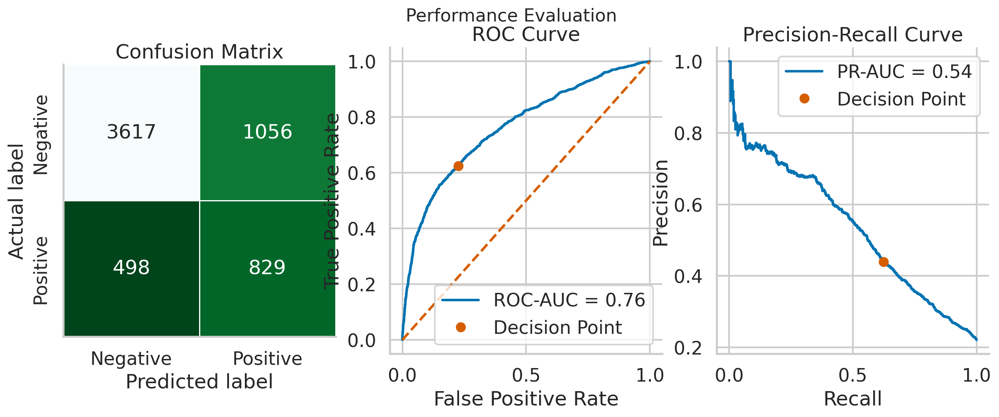

In [74]:
tuned_perf = performance_evaluation_report(
    tuned_lgbm, X_test, y_test,
    show_plot=True,
    show_pr_curve=True
)

print(f'Recall: {tuned_perf["recall"]:.4f}')
sns.despine()

#### Conditional hyperparameter space

1. Define a conditional hyperparameter space:

In [75]:
conditional_search_space = {
    "boosting_type": hp.choice("boosting_type", [
        {"boosting_type": "gbdt",
         "subsample": hp.uniform("gdbt_subsample", 0.5, 1),
         "subsample_freq": scope.int(
            hp.uniform("gdbt_subsample_freq", 1, 20)
         )},
        {"boosting_type": "dart",
         "subsample": hp.uniform("dart_subsample", 0.5, 1),
         "subsample_freq": scope.int(
            hp.uniform("dart_subsample_freq", 1, 20)
         )},
        {"boosting_type": "goss",
         "subsample": 1.0,
         "subsample_freq": 0},
    ]),
    "n_estimators": hp.choice("n_estimators", [50, 100, 250, 500]),
}

In [76]:
# draw from the search space
params = sample(conditional_search_space)
params

{'boosting_type': {'boosting_type': 'goss',
  'subsample': 1.0,
  'subsample_freq': 0},
 'n_estimators': 500}

In [77]:
# retrieve the conditional parameters, set to default if missing
subsample = params["boosting_type"].get("subsample", 1.0)
subsample_freq = params["boosting_type"].get("subsample_freq", 0)

# fill in the params dict with the conditional values
params["boosting_type"] = params["boosting_type"]["boosting_type"]
params["subsample"] = subsample
params["subsample_freq"] = subsample_freq

params

{'boosting_type': 'goss',
 'n_estimators': 500,
 'subsample': 1.0,
 'subsample_freq': 0}

2. Modify the objective function to account for the conditional hyperparameter space:

In [78]:
def modified_objective(params, n_folds=N_FOLDS, random_state=RANDOM_STATE, metric=EVAL_METRIC):

    # retrieve the conditional parameters, set to default if missing
    subsample = params["boosting_type"].get("subsample", 1.0)
    subsample_freq = params["boosting_type"].get("subsample_freq", 0)

    # fill in the params dict with the conditional values
    params["boosting_type"] = params["boosting_type"]["boosting_type"]
    params["subsample"] = subsample
    params["subsample_freq"] = subsample_freq

    # useful for debugging
    if DEBUG:
        print(params)

    model = LGBMClassifier(**params, random_state=random_state)
    k_fold = StratifiedKFold(n_folds, shuffle=True,
                             random_state=random_state)

    scores = cross_val_score(model, X_train, y_train,
                             cv=k_fold, scoring=metric)
    loss = -1 * scores.mean()

    return {"loss": loss, "params": params, "status": STATUS_OK}

3. Run the Bayesian HPO with the conditional hyperparam space:

In [79]:
trials = Trials()
best_set_2 = fmin(fn= modified_objective,
                  space= conditional_search_space,
                  algo= tpe.suggest,
                  max_evals = MAX_EVALS,
                  trials= trials,
                  rstate=np.random.default_rng(RANDOM_STATE))

100%|██████████| 200/200 [42:38<00:00, 12.79s/trial, best loss: -0.3838763842517896]


In [80]:
# store the results in a pickle
pickle.dump(trials, open("light_gbm_200_runs_conditional_space.p", "wb"))

4. Inspect the best hyperparameters:

In [81]:
space_eval(conditional_search_space , best_set_2)

{'boosting_type': {'boosting_type': 'goss',
  'subsample': 1.0,
  'subsample_freq': 0},
 'n_estimators': 250}

5. Clean up the dictionary before training a model:

In [82]:
best_params_2 = space_eval(conditional_search_space , best_set_2)

# retrieve the conditional parameters, set to default if missing
subsample = best_params_2["boosting_type"].get("subsample", 1.0)
subsample_freq = best_params_2["boosting_type"].get("subsample_freq", 0)

# fill in the best_params_2 dict with the conditional values
best_params_2["boosting_type"] = best_params_2["boosting_type"]["boosting_type"]
best_params_2["subsample"] = subsample
best_params_2["subsample_freq"] = subsample_freq

best_params_2

{'boosting_type': 'goss',
 'n_estimators': 250,
 'subsample': 1.0,
 'subsample_freq': 0}

6. Train the tuned LightGBM classifier:

--------------------------
----Evaluation metrics----
--------------------------
Accuracy: 0.8117
Precision: 0.6166
Recall (Sensitivity): 0.3926
Specificity: 0.9307
F1-Score: 0.4797
Cohen's Kappa: 0.3716
Recall: 0.3926


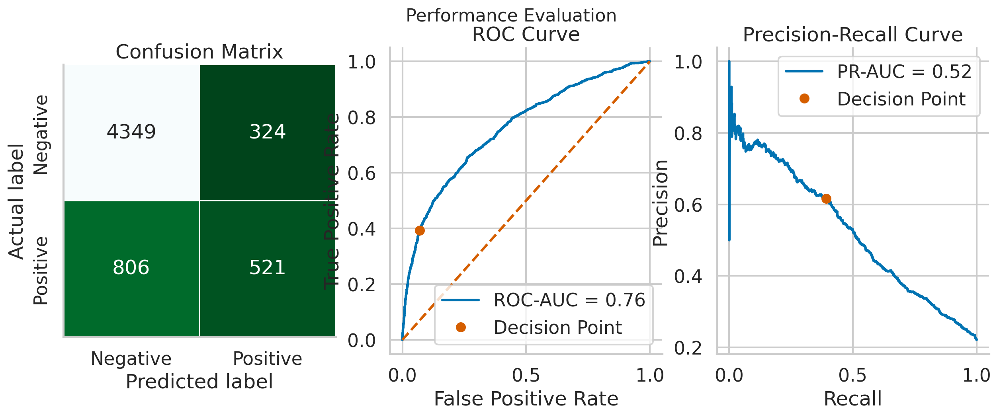

In [83]:
tuned_lgbm_2 = LGBMClassifier(
    **best_params_2,
    random_state=RANDOM_STATE
)
tuned_lgbm_2.fit(X_train, y_train)

tuned_perf_2 = performance_evaluation_report(tuned_lgbm_2, X_test, y_test,
                                           show_plot=True,
                                           show_pr_curve=True)

print(f'Recall: {tuned_perf_2["recall"]:.4f}')

sns.despine()

#### A deep-dive into the explored hyperparameters

0. Load the trials file (if needed):

In [84]:
trials = pickle.load(open("light_gbm_200_runs.p", "rb"))

1. Import the additional libraries:

In [85]:
from pandas.io.json import json_normalize

2. Define a helper function for drawing samples from a hyperparameter search space:

In [86]:
def draw_samples(search_space, n_samples=10000):
    samples_list = []

    for _ in range(n_samples):
        samples_list.append(sample(search_space))

    return samples_list

3. Plot the distribution of the learning rate:

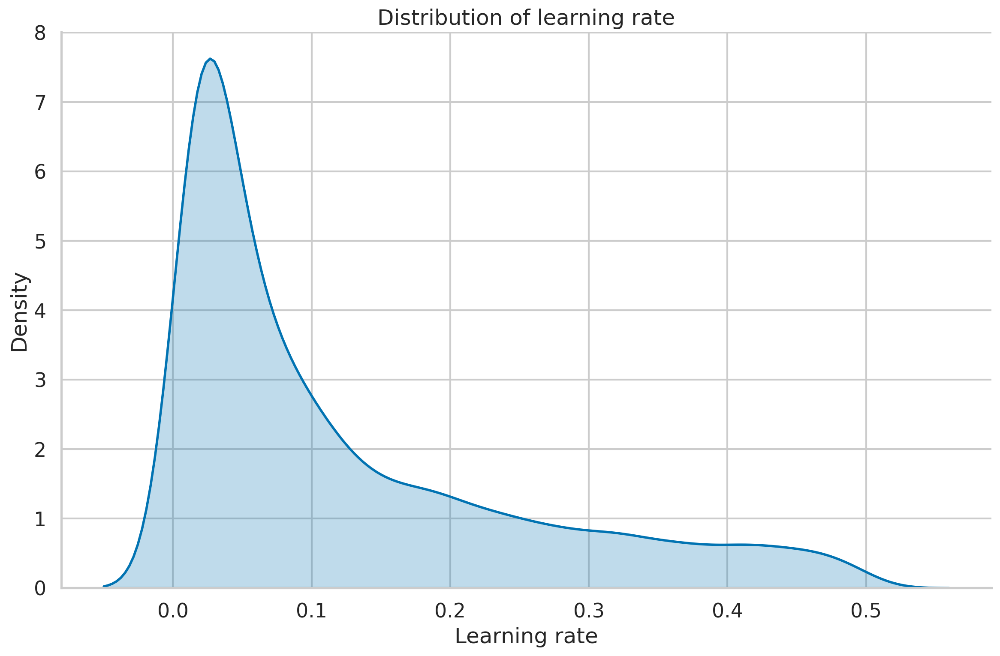

In [87]:
lr_samples = draw_samples(search_space["learning_rate"])

sns.kdeplot(lr_samples, linewidth = 2, shade = True)
plt.title("Distribution of learning rate")
plt.xlabel("Learning rate")
plt.ylabel("Density")

plt.tight_layout()
sns.despine()

4. Create the KDE plot of `min_child_samples`:

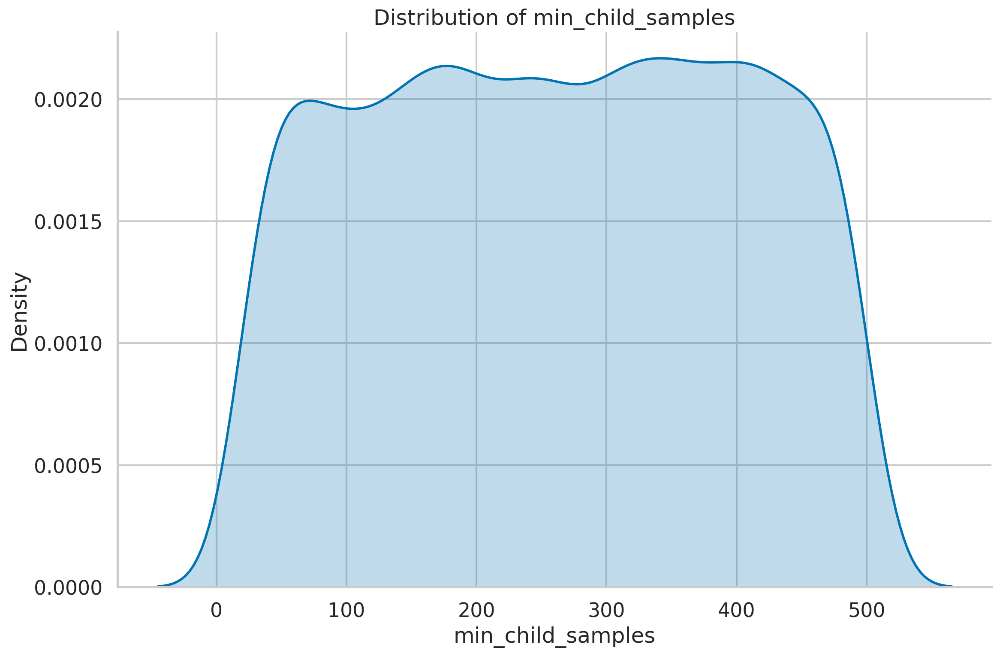

In [88]:
mcs_samples = draw_samples(search_space["min_child_samples"])

sns.kdeplot(mcs_samples, linewidth = 2, shade = True)
plt.title("Distribution of min_child_samples")
plt.xlabel("min_child_samples")
plt.ylabel("Density")

plt.tight_layout()
sns.despine()

5. Plot the distribution of `min_child_samples`:

We could also use the `sns.countplot`, however, we only wanted to plot a restricted range of values to keep the plot readable.

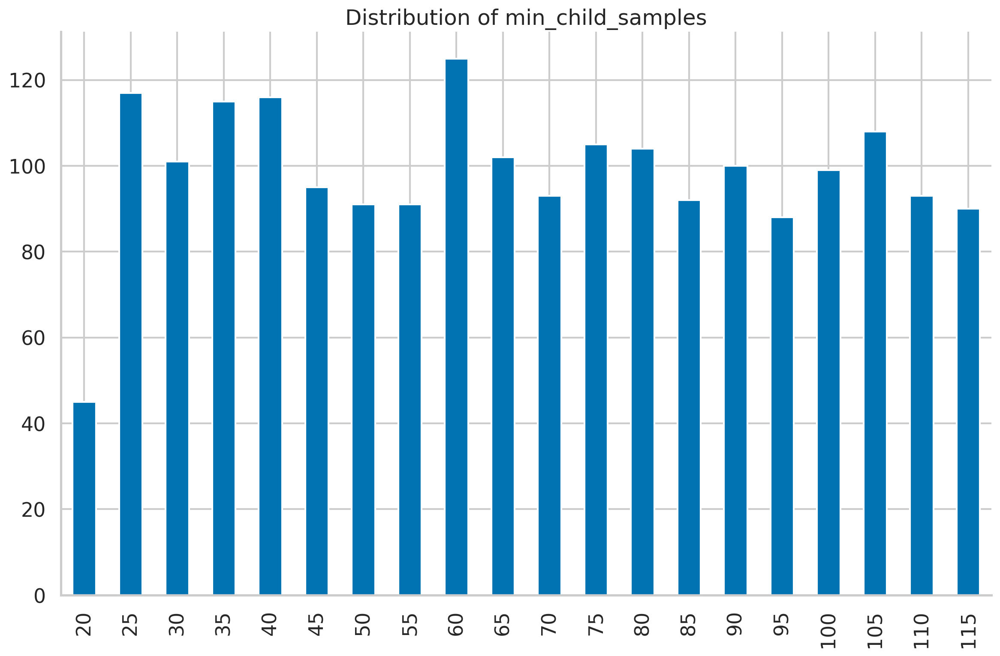

In [89]:
(
    pd.Series(mcs_samples)
    .value_counts()
    .sort_index()
    .head(20)
    .plot(kind="bar",
          title="Distribution of min_child_samples")
);

plt.tight_layout()
sns.despine()

6. Store all the information from `trials.results` into a DataFrame:

In [90]:
results_df = pd.DataFrame(trials.results)
params_df = json_normalize(results_df["params"])
results_df = pd.concat([results_df.drop("params", axis=1), params_df],
                       axis=1)
results_df["iteration"] = np.arange(len(results_df)) + 1
results_df.sort_values("loss")

,loss,status,boosting_type,colsample_bytree,is_unbalance,learning_rate,max_depth,min_child_samples,n_estimators,num_leaves,reg_alpha,reg_lambda,iteration
65,-0.653232,ok,goss,0.565226,True,0.406557,8,465,50,11,0.251143,0.746807,66
150,-0.651535,ok,goss,0.858142,True,0.245345,10,200,50,32,0.082357,0.685936,151
33,-0.651160,ok,goss,0.688101,True,0.280988,6,320,50,22,0.532602,0.386788,34
74,-0.650030,ok,goss,0.588414,True,0.331966,7,500,50,43,0.628879,0.449794,75
26,-0.648333,ok,goss,0.776146,True,0.478969,10,225,50,42,0.350957,0.588859,27
...,...,...,...,...,...,...,...,...,...,...,...,...,...
17,-0.182334,ok,gbdt,0.354614,False,0.025030,5,90,50,38,0.103082,0.324949,18
3,-0.170277,ok,dart,0.708472,False,0.022381,11,55,50,61,0.212217,0.403778,4
6,-0.105857,ok,gbdt,0.393251,False,0.018363,19,265,50,13,0.996987,0.699079,7
48,-0.075721,ok,dart,0.493282,False,0.011976,14,245,100,59,0.049513,0.358410,49


## Feature Importance

### Benefit for Knowing the Importance of Features
- remove potiential noise and reduce running time by removing least important features
- understand the model logics and verify model's correctness

### Methods of Calculating Feature Importance
- **Mean Decrease in Impurity(MDI)**
  - eg: for decision tree, we use `Gini index, Entropy, MSE` to create best splits and know how much each feature contributes to decreasing weighted impurity.
  - advantages: easy operation and fast computation
  - disadvantages:
    - biased: pay more attention on <u>continuous features or high-cardinality categorical variables</u>.
    - not practically accurate for unseen data
- **Drop-column Feature Importance**
  - repeatedly compare the model dropping one specific column and the model with all features
  - advantage: more accurate measure of feature importance
  - disadvantage: highest computational cost for retraining model
- **Permutation Feature Importance**
  - train the baseline model and get the score1, reshuffle the values of one feature, use the entire dataset to get prediction and score_i.
    - feature importance=|score1-score_i|, the larger diff, the bigger feature importance
  - Advantage:
    - no need to retrain the model
    - reshuffle preserve the distribution of variables
  - Disadvantage: if the features are highly correlated, this method produces more inaccuract feature importance.

In [93]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline

2. Load data, preprocess it, define the model (and its hyperparameters) and fit it:

--------------------------
----Evaluation metrics----
--------------------------
Accuracy: 0.8090
Precision: 0.6116
Recall (Sensitivity): 0.3738
Specificity: 0.9326
F1-Score: 0.4640
Cohen's Kappa: 0.3559


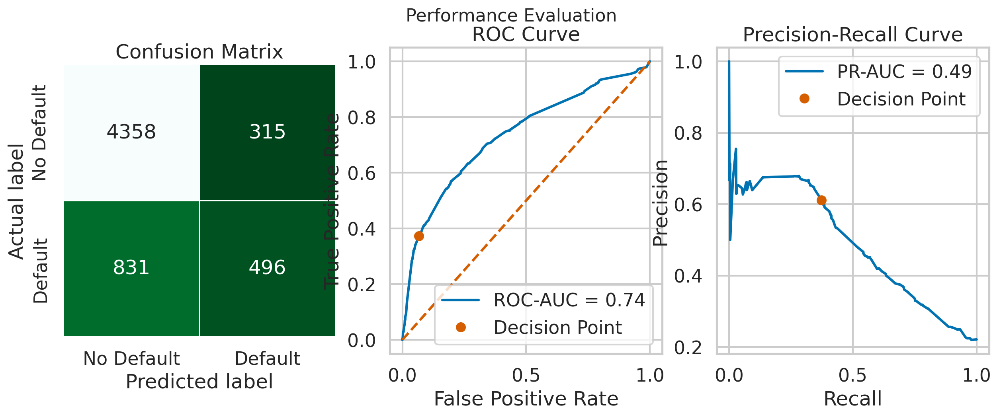

In [95]:
df = pd.read_csv("/content/credit_card_default.csv", na_values="")

X = df.copy()
y = X.pop("default_payment_next_month")
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

num_features = X_train.select_dtypes(include="number").columns.to_list()
cat_features = X_train.select_dtypes(include="object").columns.to_list()

num_pipeline = Pipeline(steps=[("imputer", SimpleImputer(strategy="median"))])

cat_list = [list(X_train[col].dropna().unique()) for col in cat_features]

cat_pipeline = Pipeline(steps=[("imputer", SimpleImputer(strategy="most_frequent")),("onehot", OneHotEncoder(categories=cat_list, sparse=False, handle_unknown="error", drop="first"))])

preprocessor = ColumnTransformer(
    transformers=[
        ("numerical", num_pipeline, num_features),
        ("categorical", cat_pipeline, cat_features)
    ],
    remainder="drop"
)

rf_pipeline = Pipeline(
    steps=[("preprocessor", preprocessor),
           ("classifier", RandomForestClassifier(random_state=42))]
)

# optional step
# set the hyperparameters to the one obtained from tuning in Recipe 14.1
best_params = {
    "n_estimators": 300,
    "min_samples_split": 2,
    "min_samples_leaf": 7,
    "max_features": None,
    "max_depth": 8,
    "bootstrap": False
}
rf_pipeline["classifier"].set_params(**best_params)

rf_pipeline.fit(X_train, y_train)

LABELS = ["No Default", "Default"]
rf_perf = performance_evaluation_report(rf_pipeline, X_test,
                                        y_test, labels=LABELS,
                                        show_plot=True,
                                        show_pr_curve=True)

3. Sanity check for the recall score (compared to results in Recipe 14.1):

In [96]:
print(f"Recall: {rf_perf['recall']:.4f}")

Recall: 0.3738


1. Import the libraries:

In [97]:
import numpy as np
import pandas as pd
from sklearn.inspection import permutation_importance
from sklearn.metrics import recall_score
from sklearn.base import clone

2. Extract the classifier and preprocessor from the fitted pipeline:

In [98]:
rf_classifier = rf_pipeline.named_steps["classifier"]
preprocessor = rf_pipeline.named_steps["preprocessor"]

3. Recover feature names from the preprocessing transformer and transform the training/test sets:

In [99]:
feat_names = list(preprocessor.get_feature_names_out())
feat_names = [name.replace("numerical__", "").replace("categorical__", "") for name in feat_names]

X_train_preprocessed = pd.DataFrame(
    preprocessor.transform(X_train),
    columns=feat_names
)

X_test_preprocessed = pd.DataFrame(
    preprocessor.transform(X_test),
    columns=feat_names
)

4. Extract the MDI feature importance and calculate the cumulative importance:

In [100]:
rf_feat_imp = pd.DataFrame(rf_classifier.feature_importances_,
                           index=feat_names,
                           columns=["mdi"])

rf_feat_imp["mdi_cumul"] = np.cumsum(
    rf_feat_imp
    .sort_values("mdi", ascending=False)
    .loc[:, "mdi"]).loc[feat_names]

In [101]:
rf_feat_imp.head()

,mdi,mdi_cumul
limit_bal,0.045303,0.752165
age,0.018915,0.829687
bill_statement_sep,0.029459,0.781625
bill_statement_aug,0.013519,0.903986
bill_statement_jul,0.014185,0.876482


5. Define a function for plotting top X features in terms of their importance:

In [102]:
def plot_most_important_features(feat_imp, title, n_features=10, bottom=False):
    """
    Function for plotting the top/bottom x features in terms of their importance.

    Parameters
    ----------
    feat_imp : A pd.Series with calculated feature importances
    title :A string representing the title of calculating the importances.
    n_features : Number of top/bottom features to plot
    bottom : Indicates if the plot should contain the bottom feature importances.

    Returns
    -------
    ax : cointaining the plot
    """

    if bottom:
        indicator = "Bottom"
        feat_imp = feat_imp.sort_values(ascending=True)
    else:
        indicator = "Top"
        feat_imp = feat_imp.sort_values(ascending=False)

    ax = feat_imp.head(n_features).plot.barh()
    ax.invert_yaxis()
    ax.set(title=f"{title} ({indicator} {n_features})",
           xlabel="Importance",
           ylabel="Feature")

    return ax

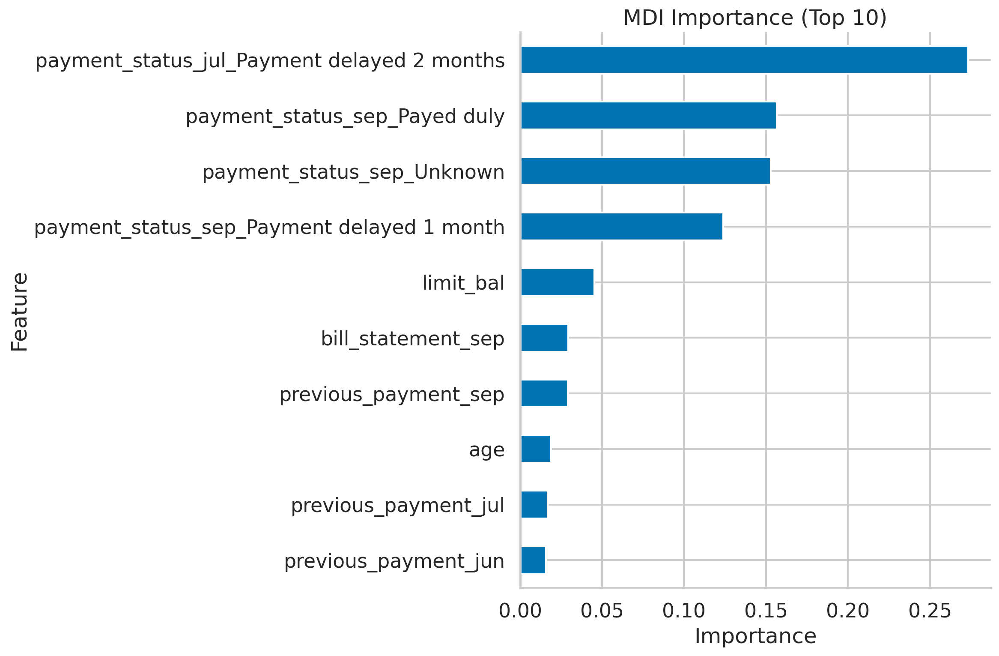

In [103]:
plot_most_important_features(rf_feat_imp["mdi"],
                             title="MDI Importance")

plt.tight_layout()
sns.despine()

6. Plot the cumulative importance of the features:

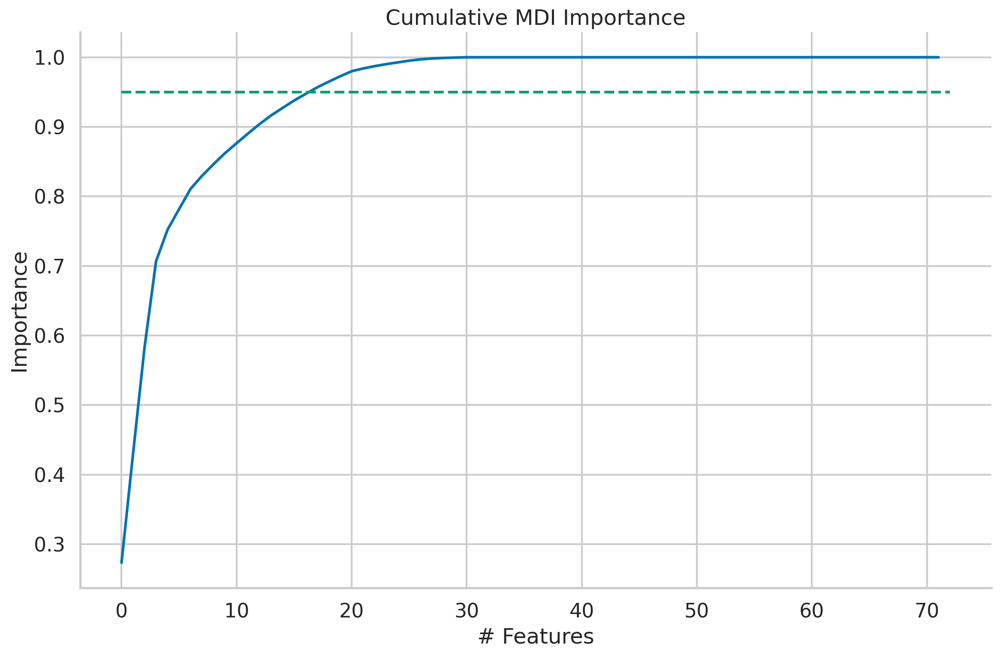

In [104]:
x_values = range(len(feat_names))

fig, ax = plt.subplots()
ax.plot(x_values, rf_feat_imp["mdi_cumul"].sort_values(), "b-")
ax.hlines(y=0.95, xmin=0, xmax=len(x_values), color="g", linestyles="dashed")
ax.set(title="Cumulative MDI Importance", xlabel="# Features", ylabel="Importance")
plt.tight_layout()
sns.despine()

In [105]:
top_10_importance = rf_feat_imp.sort_values("mdi", ascending=False).head(10)["mdi"].sum()
importance_95_perc = rf_feat_imp[rf_feat_imp["mdi_cumul"] <= 0.95].shape[0]

print(f"Top 10 features account for {100 * top_10_importance:.2f}% of the total importance.")
print(f"Top {importance_95_perc} features account for 95% of importance.")

Top 10 features account for 86.23% of the total importance.
Top 17 features account for 95% of importance.


7. Calculate and plot permutation importance using the training set:

In [106]:
perm_result_train = permutation_importance(
    rf_classifier, X_train_preprocessed, y_train,
    n_repeats=25, scoring="recall",
    random_state=42, n_jobs=-1
)

rf_feat_imp["perm_imp_train"] = (perm_result_train["importances_mean"])

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(


In [107]:
perm_result_train.keys()

dict_keys(['importances_mean', 'importances_std', 'importances'])

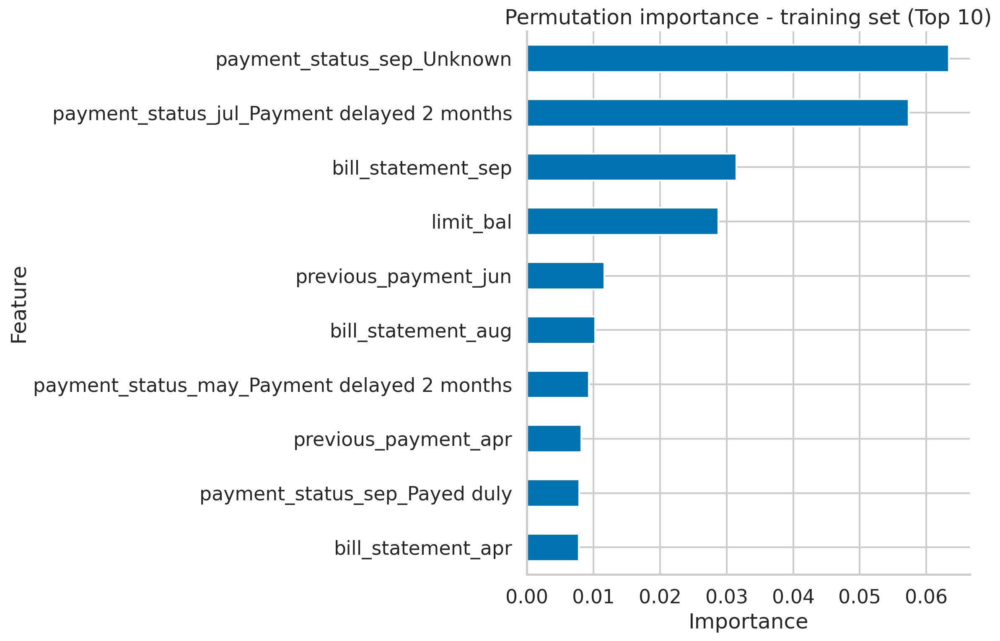

In [108]:
plot_most_important_features(
    rf_feat_imp["perm_imp_train"],
    title="Permutation importance - training set"
)

plt.tight_layout()
sns.despine()

8. Calculate and plot permutation importance using the test set:

In [109]:
perm_result_test = permutation_importance(
    rf_classifier, X_test_preprocessed, y_test,
    n_repeats=25, scoring="recall",
    random_state=42, n_jobs=-1
)

rf_feat_imp["perm_imp_test"] = (
    perm_result_test["importances_mean"]
)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(


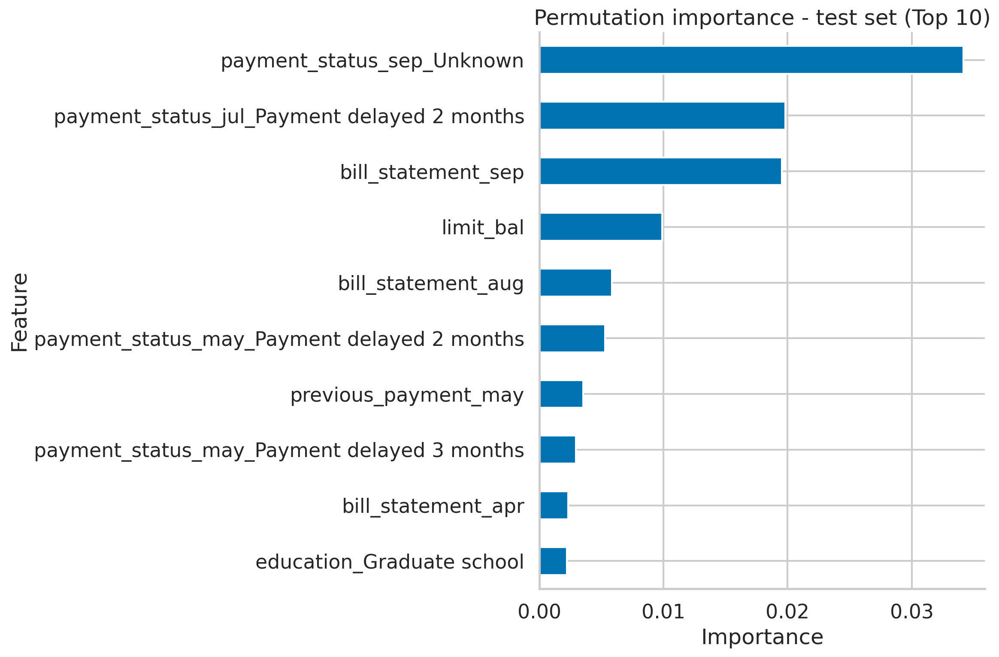

In [110]:
plot_most_important_features(
    rf_feat_imp["perm_imp_test"],
    title="Permutation importance - test set"
)

plt.tight_layout()
sns.despine()

9. Define a function for calculating the drop-column feature importance:

In [111]:
def drop_col_feat_imp(model, X, y, metric, random_state=42):

    model_clone = clone(model)
    model_clone.random_state = random_state
    model_clone.fit(X, y)
    benchmark_score = metric(y, model_clone.predict(X))

    importances = []

    for ind, col in enumerate(X.columns):
        print(f"Dropping {col} ({ind+1}/{len(X.columns)})")
        model_clone = clone(model)
        model_clone.random_state = random_state
        model_clone.fit(X.drop(col, axis = 1), y)
        drop_col_score = metric(
            y, model_clone.predict(X.drop(col, axis = 1))
        )
        importances.append(benchmark_score - drop_col_score)

    return importances

10. Calculate and plot the drop-column feature importance:

In [112]:
rf_feat_imp["drop_column_imp"] = drop_col_feat_imp(
    rf_classifier.set_params(**{"n_jobs": -1}),
    X_train_preprocessed,
    y_train,
    metric = recall_score,
    random_state = 42
)

Dropping limit_bal (1/72)
Dropping age (2/72)
Dropping bill_statement_sep (3/72)
Dropping bill_statement_aug (4/72)
Dropping bill_statement_jul (5/72)
Dropping bill_statement_jun (6/72)
Dropping bill_statement_may (7/72)
Dropping bill_statement_apr (8/72)
Dropping previous_payment_sep (9/72)
Dropping previous_payment_aug (10/72)
Dropping previous_payment_jul (11/72)
Dropping previous_payment_jun (12/72)
Dropping previous_payment_may (13/72)
Dropping previous_payment_apr (14/72)
Dropping sex_Male (15/72)
Dropping education_Graduate school (16/72)
Dropping education_High school (17/72)
Dropping education_Others (18/72)
Dropping marriage_Married (19/72)
Dropping marriage_Others (20/72)
Dropping payment_status_sep_Payment delayed 1 month (21/72)
Dropping payment_status_sep_Unknown (22/72)
Dropping payment_status_sep_Payed duly (23/72)
Dropping payment_status_sep_Payment delayed 3 months (24/72)
Dropping payment_status_sep_Payment delayed 4 months (25/72)
Dropping payment_status_sep_Payment

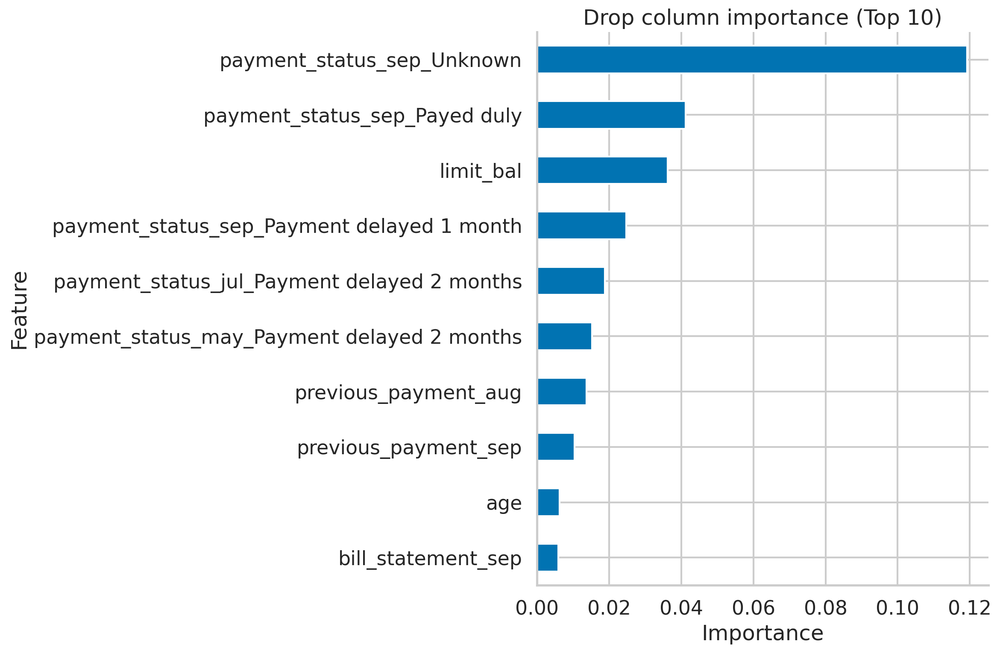

In [113]:
plot_most_important_features(rf_feat_imp["drop_column_imp"],
                             title="Drop column importance")
plt.tight_layout()
sns.despine()

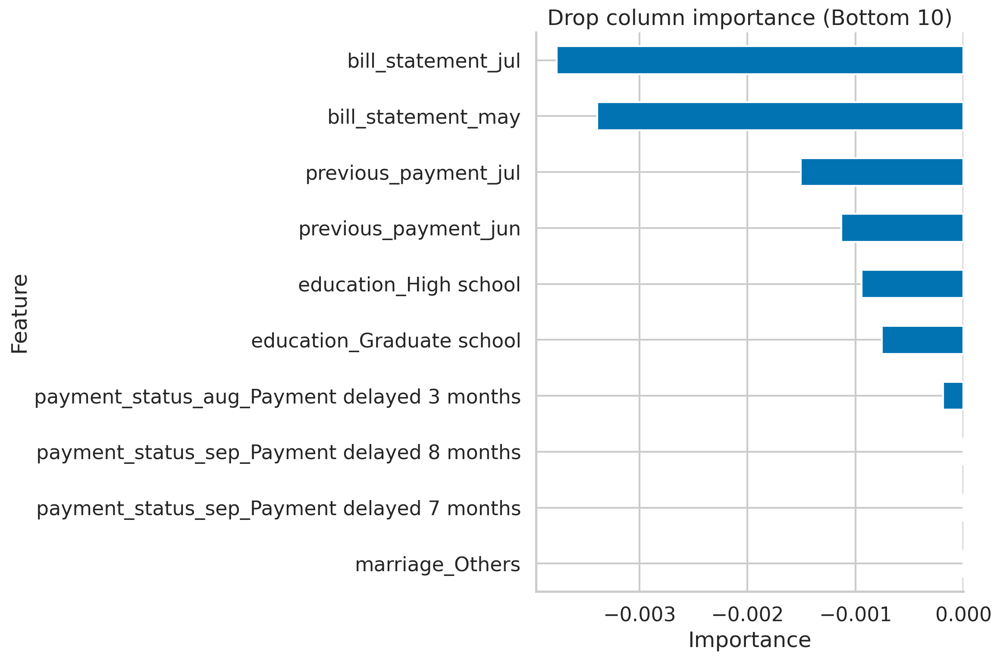

In [114]:
plot_most_important_features(rf_feat_imp["drop_column_imp"],
                             title="Drop column importance",
                             bottom=True)
plt.tight_layout()
sns.despine()

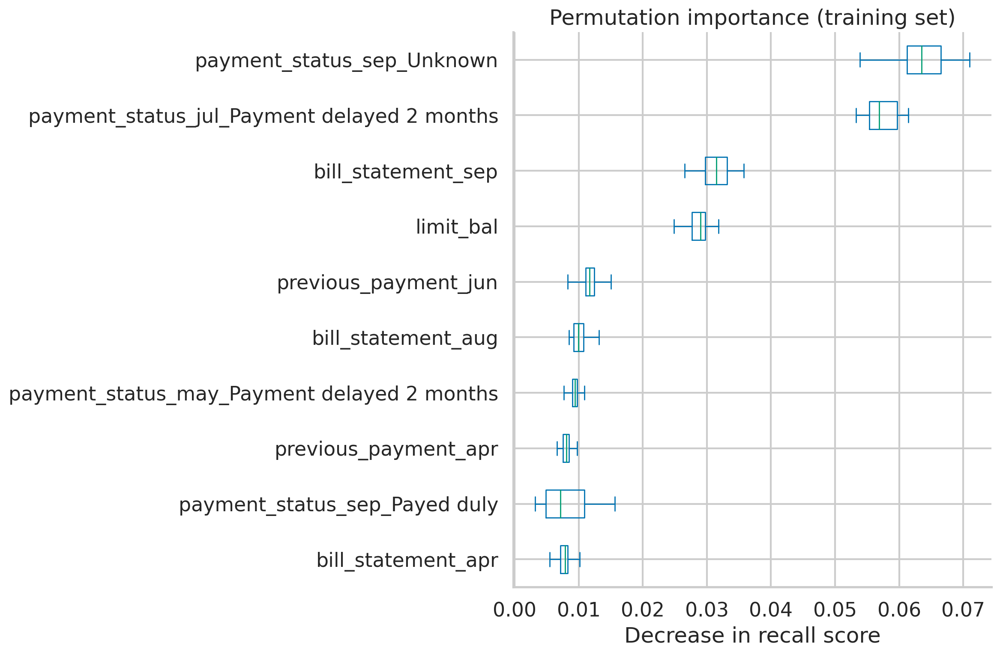

In [115]:
sorted_imp_ind = perm_result_train["importances_mean"].argsort()[-10:]

importances = pd.DataFrame(
    perm_result_train["importances"][sorted_imp_ind].T,
    columns=X_train_preprocessed.columns[sorted_imp_ind],
)

ax = importances.plot.box(vert=False, whis=10)
ax.set_title("Permutation importance (training set)")
ax.set_xlabel("Decrease in recall score")

plt.tight_layout()
sns.despine()

## Feature Selection

In [147]:
import pandas as pd
from sklearn.model_selection import train_test_split
RANDOM_STATE = 42
df = pd.read_csv("/content/creditcard.csv")
X = df.copy().drop(columns=["Time"])
y = X.pop("Class")
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

1. Import the libraries:

In [148]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import recall_score
from sklearn.feature_selection import RFE, RFECV, SelectKBest, SelectFromModel, mutual_info_classif
from sklearn.model_selection import StratifiedKFold

2. Train the benchmark model:

In [149]:
rf = RandomForestClassifier(random_state=RANDOM_STATE, n_jobs=-1)
rf.fit(X_train, y_train)

recall_train = recall_score(y_train, rf.predict(X_train))
recall_test = recall_score(y_test, rf.predict(X_test))
print(f"Recall score training: {recall_train:.4f}")
print(f"Recall score test: {recall_test:.4f}")

Recall score training: 1.0000
Recall score test: 0.8265


3. Select the best features using Mutual Information:

In [150]:
scores = []
n_features_list = list(range(2, len(X_train.columns)+1))

for n_feat in n_features_list:
    print(f"Keeping {n_feat} most important features")
    mi_selector = SelectKBest(mutual_info_classif, k=n_feat)
    X_train_new = mi_selector.fit_transform(X_train, y_train)
    X_test_new = mi_selector.transform(X_test)

    rf.fit(X_train_new, y_train)
    recall_scores = [
        recall_score(y_train, rf.predict(X_train_new)),
        recall_score(y_test, rf.predict(X_test_new))
    ]
    scores.append(recall_scores)

mi_scores_df = pd.DataFrame(
    scores,
    columns=["train_score", "test_score"],
    index=n_features_list
)

Keeping 2 most important features
Keeping 3 most important features
Keeping 4 most important features
Keeping 5 most important features
Keeping 6 most important features
Keeping 7 most important features
Keeping 8 most important features
Keeping 9 most important features
Keeping 10 most important features
Keeping 11 most important features
Keeping 12 most important features
Keeping 13 most important features
Keeping 14 most important features
Keeping 15 most important features
Keeping 16 most important features
Keeping 17 most important features
Keeping 18 most important features
Keeping 19 most important features
Keeping 20 most important features
Keeping 21 most important features
Keeping 22 most important features
Keeping 23 most important features
Keeping 24 most important features
Keeping 25 most important features
Keeping 26 most important features
Keeping 27 most important features
Keeping 28 most important features
Keeping 29 most important features


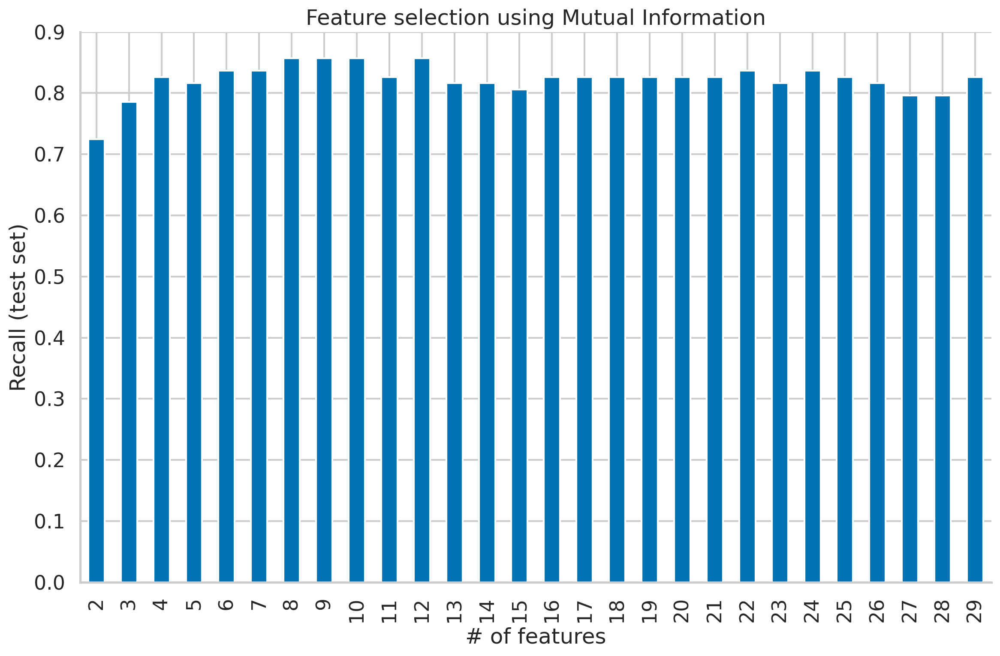

In [151]:
mi_scores_df["test_score"].plot(kind="bar",
                                title="Feature selection using Mutual Information",
                                xlabel="No. of features",
                                ylabel="Recall (test set)")

plt.tight_layout()
sns.despine()

In [152]:
mi_scores_df["test_score"].sort_values(ascending=False).head(5)

8     0.857143
9     0.857143
10    0.857143
12    0.857143
24    0.836735
Name: test_score, dtype: float64

In [153]:
mi_selector = SelectKBest(mutual_info_classif, k=8)
mi_selector.fit(X_train, y_train)
print(f"Most importance features according to MI: {mi_selector.get_feature_names_out()}")

Most importance features according to MI: ['V3' 'V4' 'V10' 'V11' 'V12' 'V14' 'V16' 'V17']


4. Select the best features using MDI feature importance, retrain the model, evaluate its performance:

In [ ]:
# fit the selector
rf_selector = SelectFromModel(rf)
rf_selector.fit(X_train, y_train)

# evaluate the model
mdi_features = X_train.columns[rf_selector.get_support()]
rf.fit(X_train[mdi_features], y_train)
recall_train = recall_score(
    y_train, rf.predict(X_train[mdi_features])
)
recall_test = recall_score(y_test, rf.predict(X_test[mdi_features]))
print(f"Recall score training: {recall_train:.4f}")
print(f"Recall score test: {recall_test:.4f}")

In [ ]:
print(f"MDI importance threshold: {rf_selector.threshold_:.4f}")
print(f"Most importance features according to MDI: {rf_selector.get_feature_names_out()}")

In [ ]:
# train the simple RF model
rf = RandomForestClassifier(random_state=RANDOM_STATE, n_jobs=-1)
rf.fit(X_train, y_train)

# recover the feature importances, sort by importance descending
mdi_imp = pd.Series(rf.feature_importances_, index=X_train.columns).sort_values(ascending=False)

# define a list for storing the scores
scores = []

# iterate increasing the number of retained features by 1 with each loop
n_features_list = range(2, len(mdi_imp)+1)
for n_feat in n_features_list:

    print(f"Keeping {n_feat} most important features")
    selected_features = mdi_imp.iloc[:n_feat].index.to_list()

    rf.fit(X_train[selected_features], y_train)
    recall_scores = [
        recall_score(y_train, rf.predict(X_train[selected_features])),
        recall_score(y_test, rf.predict(X_test[selected_features]))]
    scores.append(recall_scores)

mdi_scores_df = pd.DataFrame(
    scores,
    columns=["train_score", "test_score"],
    index=n_features_list
)

In [ ]:
mdi_scores_df.sort_values("test_score", ascending=False).head()

In [ ]:
mdi_scores_df["test_score"].plot(kind="bar",
                                 title="Feature selection using MDI",
                                 xlabel="# of features",
                                 ylabel="Recall (test set)")

plt.tight_layout()
sns.despine()

5. Select the best 10 features using Recursive Feature Elimination:

In [194]:
rfe = RFE(estimator=rf, n_features_to_select=10, verbose=1)
rfe.fit(X_train, y_train)

Fitting estimator with 29 features.
Fitting estimator with 28 features.
Fitting estimator with 27 features.


KeyboardInterrupt: ignored

In [ ]:
rfe_features = rfe.get_feature_names_out()
rf.fit(X_train[rfe_features], y_train)
recall_train = recall_score(y_train, rf.predict(X_train[rfe_features]))
recall_test = recall_score(y_test, rf.predict(X_test[rfe_features]))

print(f"Most importance features according to RFE: {rfe_features}")
print(f"Recall score training: {recall_train:.4f}")
print(f"Recall score test: {recall_test:.4f}")

6. Select the best features using Recursive Feature Elimination with cross-validation:

In [ ]:
k_fold = StratifiedKFold(5, shuffle=True, random_state=42)

rfe_cv = RFECV(estimator=rf, step=1,
               cv=k_fold,
               min_features_to_select=5,
               scoring="recall",
               verbose=1,
               n_jobs=-1)
rfe_cv.fit(X_train, y_train)

In [ ]:
rfecv_features = rfe_cv.get_feature_names_out()
rf.fit(X_train[rfecv_features], y_train)
recall_train = recall_score(y_train, rf.predict(X_train[rfecv_features]))
recall_test = recall_score(y_test, rf.predict(X_test[rfecv_features]))

print(f"Most importance features according to RFECV: {rfecv_features}")
print(f"Recall score training: {recall_train:.4f}")
print(f"Recall score test: {recall_test:.4f}")

In [ ]:
# we added 5 as we set min_features_to_select to 5 while calling RFECV
cv_results_df = pd.DataFrame(rfe_cv.cv_results_)
cv_results_df.index += 5
cv_results_df

In [ ]:
cv_results_df["mean_test_score"].plot(title="Average CV score over iterations",
                                      xlabel="No. of features retained",
                                      ylabel="Avg. recall")
plt.tight_layout()
sns.despine()

In [ ]:
np.ceil((29 - 5) / 1) + 1

In [ ]:
# feature importances derived from the last fitted model
rfe_cv.estimator_.feature_importances_

## Explainable AI (XAI)

1. Import the libraries:

In [156]:
from xgboost import XGBClassifier
from sklearn.metrics import recall_score
from sklearn.inspection import (partial_dependence,
                                PartialDependenceDisplay)
!pip install shap
import shap

2. Train the ML model:

In [158]:
xgb = XGBClassifier(random_state=RANDOM_STATE,
                    n_jobs=-1)
xgb.fit(X_train, y_train)

recall_train = recall_score(y_train, xgb.predict(X_train))
recall_test = recall_score(y_test, xgb.predict(X_test))
print(f"Recall score training: {recall_train:.4f}")
print(f"Recall score test: {recall_test:.4f}")

Recall score training: 1.0000
Recall score test: 0.8163


3. Plot the ICE curves:

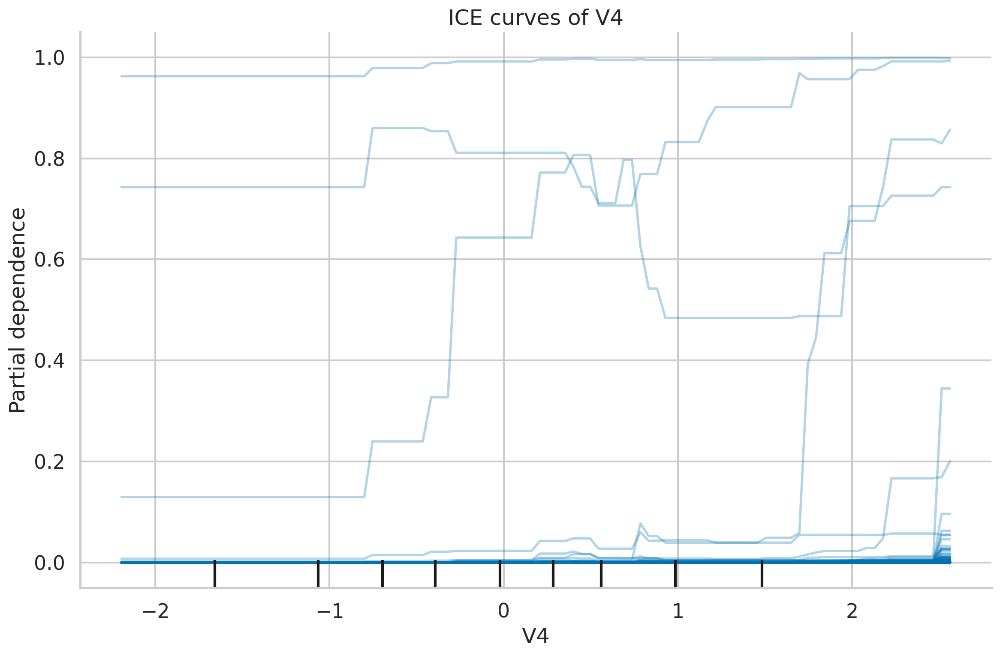

In [159]:
PartialDependenceDisplay.from_estimator(
    xgb, X_train, features=["V4"],
    kind="individual",
    subsample=5000,
    line_kw={"linewidth": 2},
    random_state=RANDOM_STATE
)
plt.title("ICE curves of V4")

plt.tight_layout()
sns.despine()

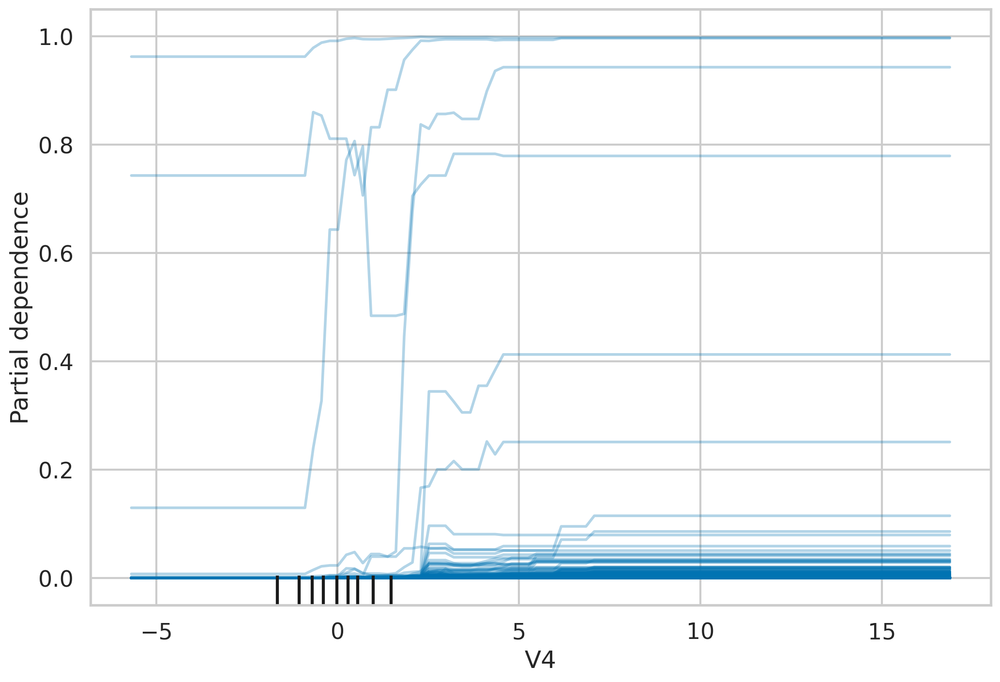

In [161]:
PartialDependenceDisplay.from_estimator(
    xgb, X_train, features=["V4"],
    kind="individual",
    subsample=5000,
    line_kw={"linewidth": 2},
    percentiles = (0,1),
    random_state=RANDOM_STATE
)

4. Plot the centered ICE curves:

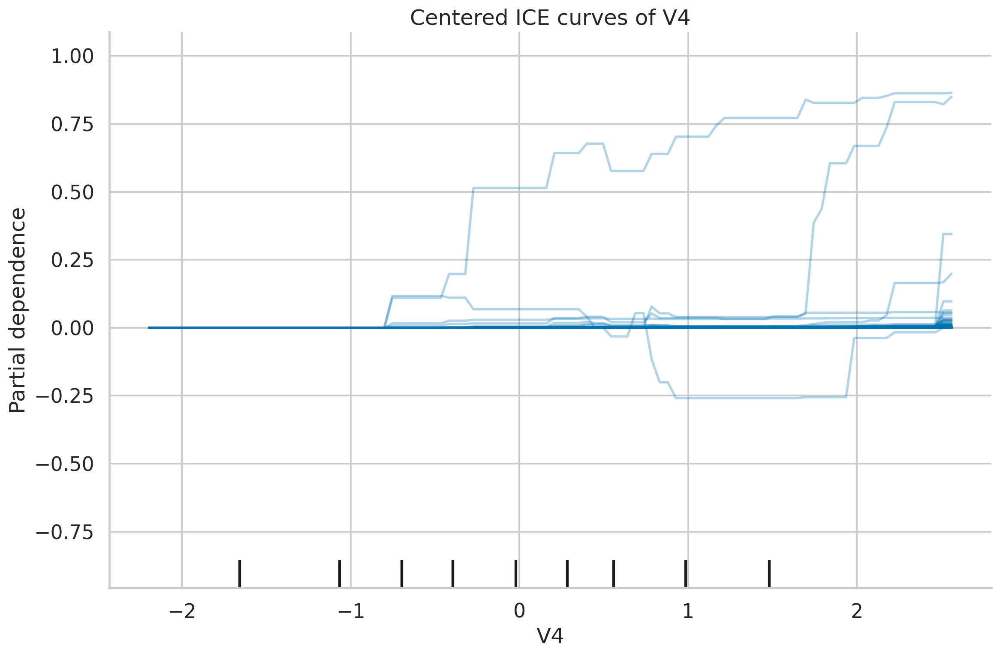

In [162]:
PartialDependenceDisplay.from_estimator(
    xgb, X_train, features=["V4"],
    kind="individual",
    subsample=5000,
    centered=True,
    line_kw={"linewidth": 2},
    random_state=RANDOM_STATE
)
plt.title("Centered ICE curves of V4")

plt.tight_layout()
sns.despine()

5. Generate the Partial Dependence Plot:

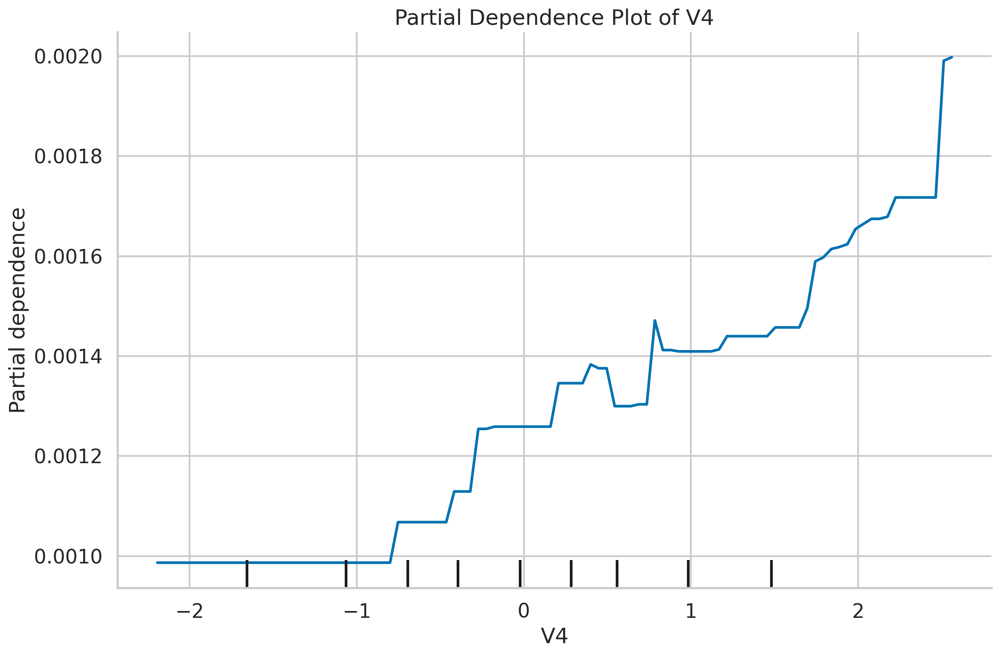

In [163]:
PartialDependenceDisplay.from_estimator(
    xgb, X_train,
    features=["V4"],
    random_state=RANDOM_STATE
)
plt.title("Partial Dependence Plot of V4")

plt.tight_layout()
sns.despine()

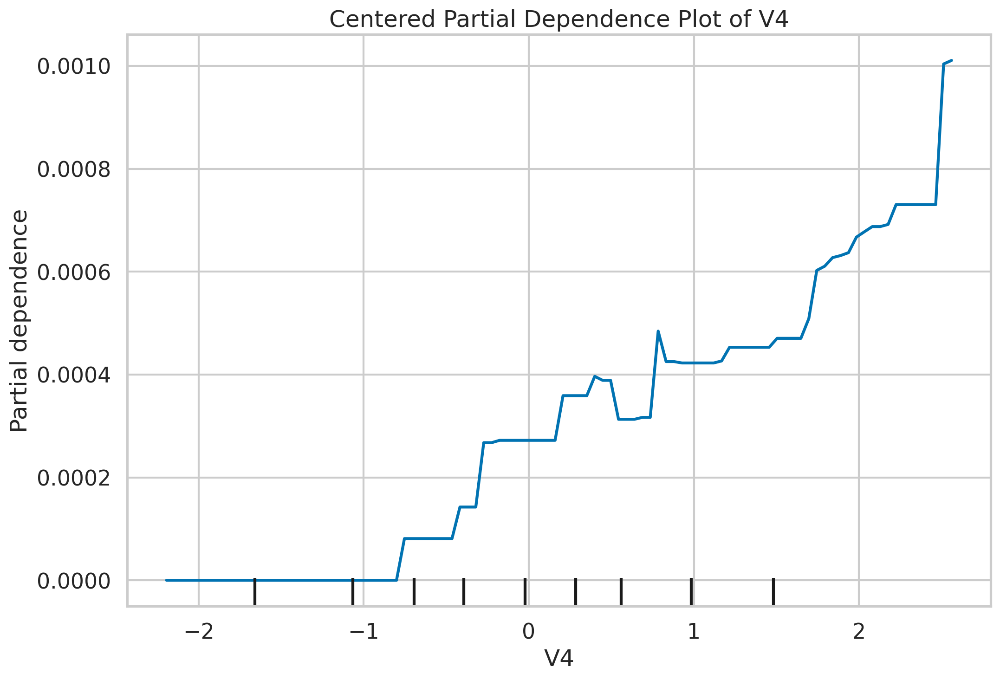

In [164]:
PartialDependenceDisplay.from_estimator(xgb, X_train,
                                        features=["V4"],
                                        random_state=RANDOM_STATE,
                                        centered=True)
plt.title("Centered Partial Dependence Plot of V4");

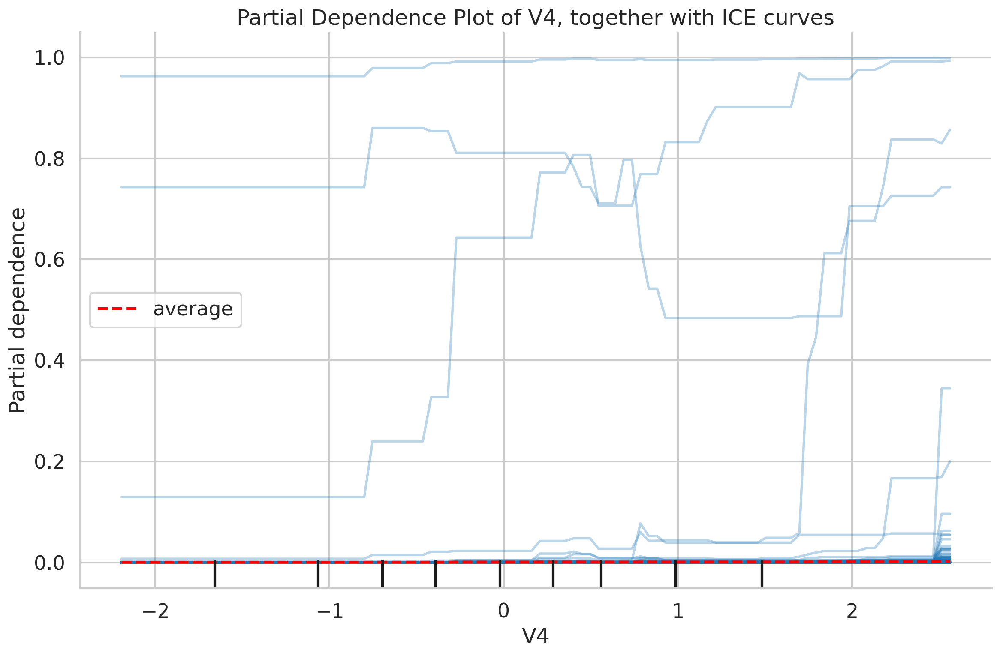

In [165]:
PartialDependenceDisplay.from_estimator(
    xgb, X_train, features=["V4"],
    kind="both",
    subsample=5000,
    ice_lines_kw={"linewidth": 2},
    pd_line_kw={"color": "red"},
    random_state=RANDOM_STATE
)
plt.title("Partial Dependence Plot of V4, together with ICE curves")

plt.tight_layout()
sns.despine()

6. Generate the individual PDPs of two features and a joint one:

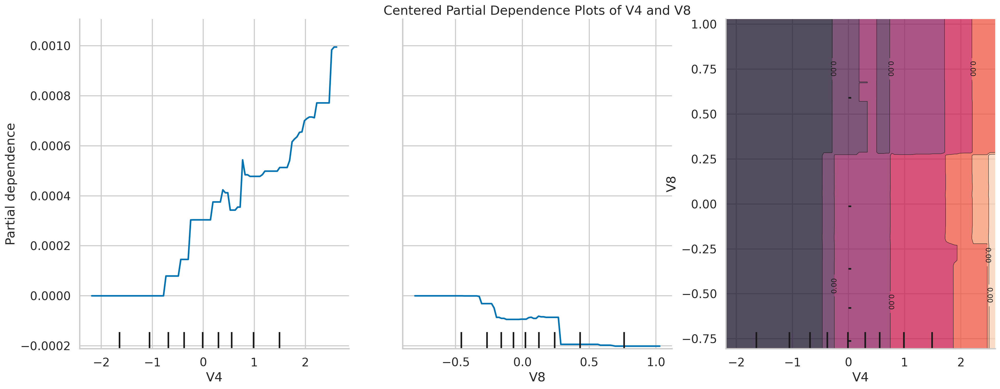

In [175]:
fig, ax = plt.subplots(figsize=(20, 8))

PartialDependenceDisplay.from_estimator(
    xgb,
    X_train.sample(20000, random_state=RANDOM_STATE),
    features=["V4", "V8", ("V4", "V8")],
    centered=True,
    ax=ax
)
ax.set_title("Centered Partial Dependence Plots of V4 and V8")

plt.tight_layout()
sns.despine()

7. Instantiate an explainer and calculate the SHAP values:

In [181]:
!pip install javascript

In [168]:
explainer = shap.TreeExplainer(xgb)
shap_values = explainer.shap_values(X)
explainer_x = explainer(X)

In [ ]:
shap_values.shape

In [170]:
# it might be required to run this command before creating the plots
shap.initjs()

8. Generate the SHAP summary plot:

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


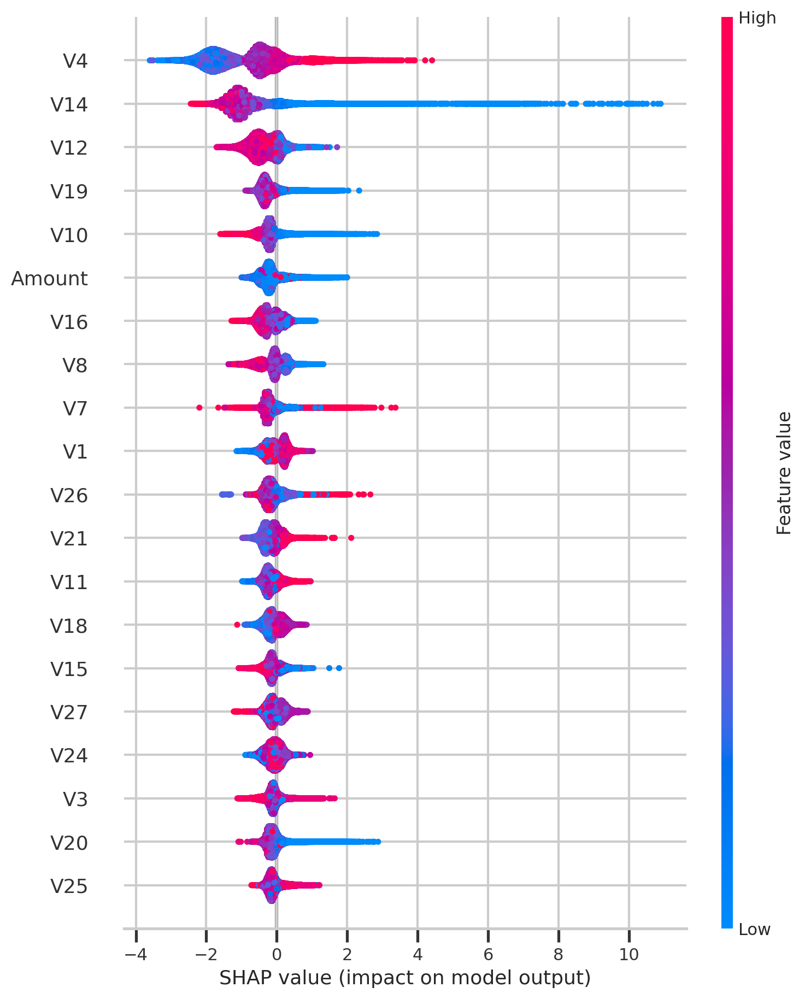

In [182]:
shap.summary_plot(shap_values, X);

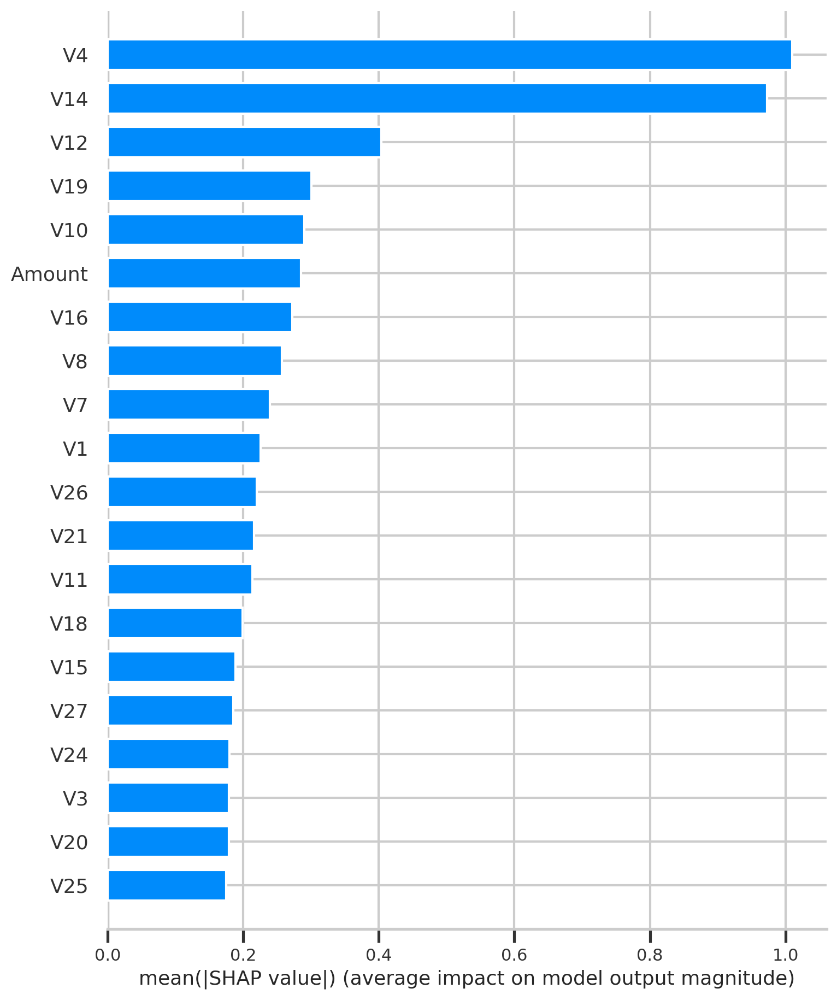

In [183]:
shap.summary_plot(shap_values, X, plot_type="bar");

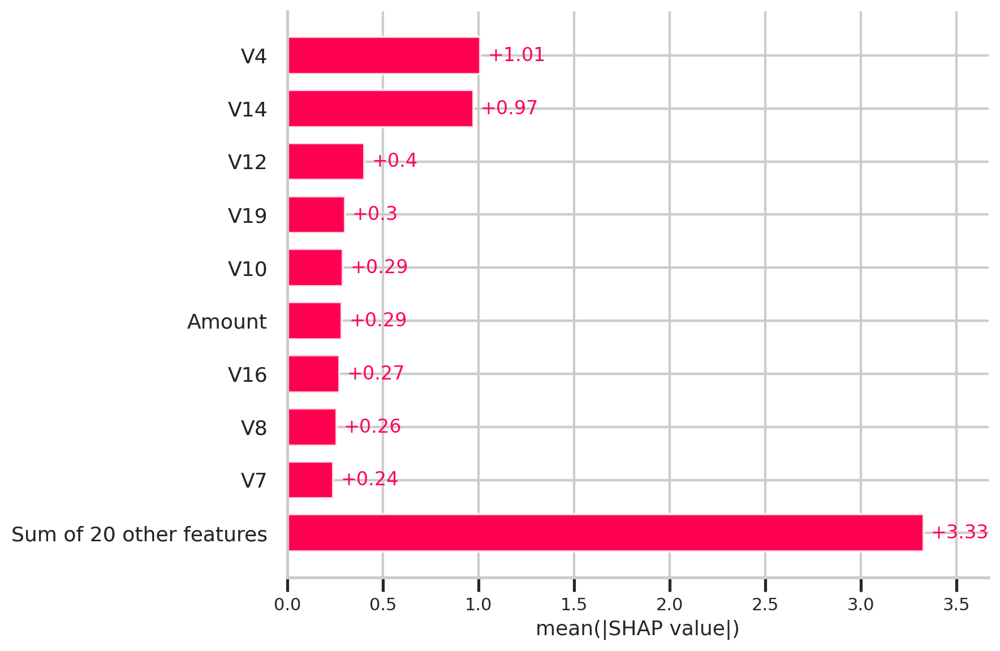

In [184]:
shap.plots.bar(explainer_x)

9. Locate an observation belonging to the positive and negative class:

#### Explaining single prediction

- With SHAP, we can generate explanations for a single prediction.
- The SHAP plot shows features that contribute to pushing the output from the base value (average model output) to the actual predicted value.
  - Red color indicates features that are pushing the prediction higher
  - blue color indicates just the opposite.

In [185]:
negative_ind = y[y == 0].index[0]
positive_ind = y[y == 1].index[0]

10. Explain those observations:

In [192]:
shap.initjs()
shap.force_plot(
    explainer.expected_value,
    shap_values[negative_ind, :],
    X.iloc[negative_ind, :]
)

In [187]:
explainer.expected_value

-8.589068

In [193]:
shap.initjs()
shap.force_plot(
    explainer.expected_value,
    shap_values[positive_ind, :],
    X.iloc[positive_ind, :]
)

11. Create a waterfall plot for the positive observation:

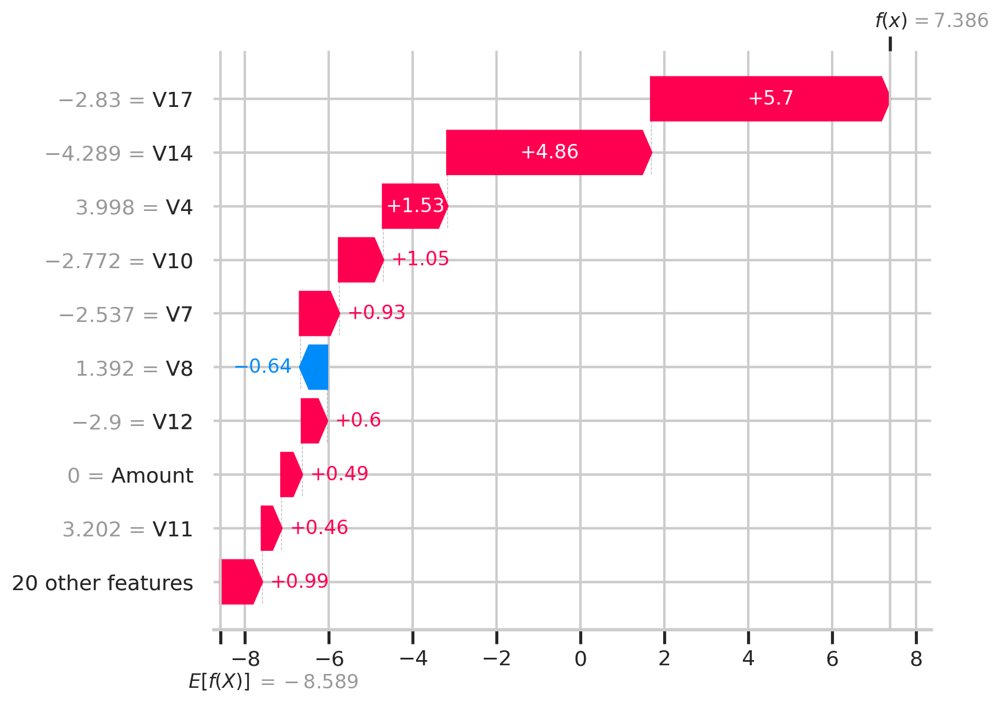

In [189]:
shap.plots.waterfall(explainer(X)[positive_ind])

12. Create a dependence plot of the `V4` feature:

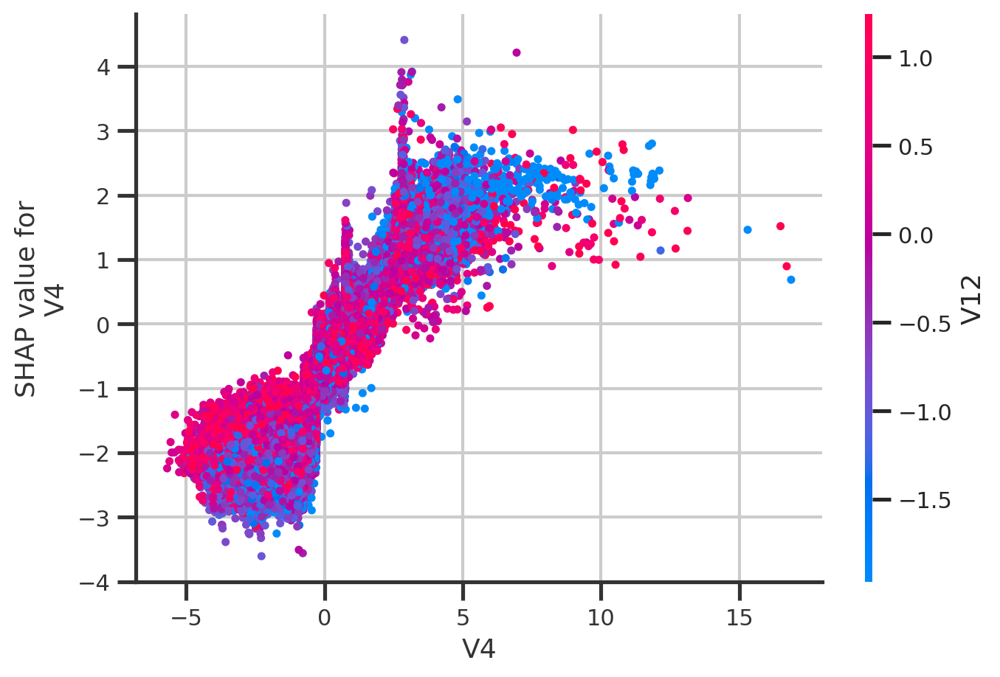

In [190]:
shap.dependence_plot("V4", shap_values, X)